# Exploration of Meritxell's expression data

In [1]:
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import random

from sklearn.cluster import KMeans

import geneinfo as gi
gi.email('kaspermunch@birc.au.dk')

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# scale down size of default plots
sns.set_context("paper")
import matplotlib as mpl
scale = 0.8
d = dict([(k, v*scale) for (k, v) in sns.plotting_context('paper').items()])
d['figure.figsize'] = [5.4, 3.5]
mpl.rcParams.update(d)

# high-res plots
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')

from matplotlib_venn import venn2, venn3

class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)

        
from matplotlib.patches import Rectangle, Polygon
from collections import defaultdict

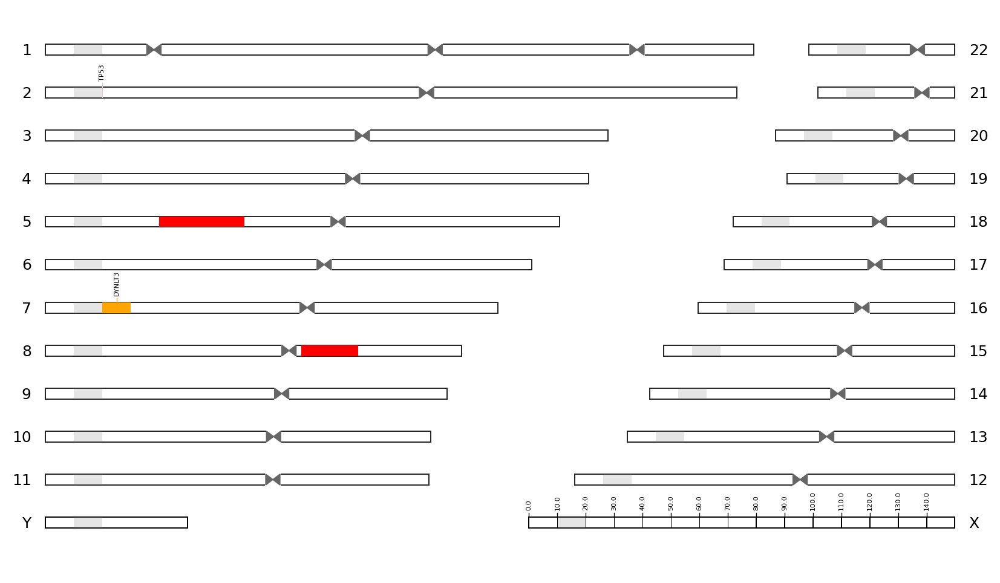

In [2]:
chrom_lengths = {'hg19': {'chr1': 249250621, 'chr2': 243199373, 'chr3': 198022430, 'chr4': 191154276, 
                          'chr5': 180915260, 'chr6': 171115067, 'chr7': 159138663, 'chr8': 146364022, 
                          'chr9': 141213431, 'chr10': 135534747, 'chr11': 135006516, 'chr12': 133851895,
                          'chr13': 115169878, 'chr14': 107349540, 'chr15': 102531392, 'chr16': 90354753, 
                          'chr17': 81195210, 'chr18': 78077248, 'chr19': 59128983, 'chr20': 63025520, 
                          'chr21': 48129895, 'chr22': 51304566, 'chrX': 155270560, 'chrY': 59373566},
                 'hg38': {'chr1': 248956422, 'chr2': 242193529, 'chr3': 198295559, 'chr4': 190214555, 
                          'chr5': 181538259, 'chr6': 170805979, 'chr7': 159345973, 'chr8': 145138636, 
                          'chr9': 138394717, 'chr10': 133797422, 'chr11': 135086622, 'chr12': 133275309, 
                          'chr13': 114364328, 'chr14': 107043718, 'chr15': 101991189, 'chr16': 90338345, 
                          'chr17': 83257441, 'chr18': 80373285, 'chr19': 58617616, 'chr20': 64444167, 
                          'chr21': 46709983, 'chr22': 50818468, 'chrX': 156040895, 'chrY': 57227415}
                }
chr_names, chr_lens = zip(*chrom_lengths['hg19'].items())
figwidth = max(chr_lens)

cent_start = [x / 2 for x in chr_lens]
cent_end = [x + 5000000 for x in cent_start]
centromeres = dict(zip(chr_names, zip(cent_start, cent_end)))
centromeres

def chrom_ideogram(annot, width=0.25, marg=5000000):
    
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_ylim(-1, 12)
    plot_width = 320000000
    
    ax.set_xlim(-marg, plot_width + marg)
    centromere_color = 'grey'

    offsets = defaultdict(dict)

    chrom_lengths = {'hg19': {'chr1': 249250621, 'chr2': 243199373, 'chr3': 198022430, 'chr4': 191154276, 
                              'chr5': 180915260, 'chr6': 171115067, 'chr7': 159138663, 'chr8': 146364022, 
                              'chr9': 141213431, 'chr10': 135534747, 'chr11': 135006516, 'chr12': 133851895,
                              'chr13': 115169878, 'chr14': 107349540, 'chr15': 102531392, 'chr16': 90354753, 
                              'chr17': 81195210, 'chr18': 78077248, 'chr19': 59128983, 'chr20': 63025520, 
                              'chr21': 48129895, 'chr22': 51304566, 'chrX': 155270560, 'chrY': 59373566},
                     'hg38': {'chr1': 248956422, 'chr2': 242193529, 'chr3': 198295559, 'chr4': 190214555, 
                              'chr5': 181538259, 'chr6': 170805979, 'chr7': 159345973, 'chr8': 145138636, 
                              'chr9': 138394717, 'chr10': 133797422, 'chr11': 135086622, 'chr12': 133275309, 
                              'chr13': 114364328, 'chr14': 107043718, 'chr15': 101991189, 'chr16': 90338345, 
                              'chr17': 83257441, 'chr18': 80373285, 'chr19': 58617616, 'chr20': 64444167, 
                              'chr21': 46709983, 'chr22': 50818468, 'chrX': 156040895, 'chrY': 57227415}
                    }
    assembly = 'hg19'
    # 1 - 22
    for i in range(1, 23, 1):
        chrom_len = chrom_lengths[assembly][f'chr{i}']

    #    chrom_len = 250000000 - i*11000000
        cent_start, cent_len = 10000000, 10000000

        if i < 12:
            h = 12 - i 
            offset = 0
            plt.text(-marg, h, f'{12-h}', fontsize=9, horizontalalignment='right')
        else:
            h = i - 12 + 1
            offset = plot_width - chrom_len
            plt.text(plot_width + marg, h, f'{12+h-1}', fontsize=9, horizontalalignment='left')

        offsets[f'chr{i}']['y'] = h
        offsets[f'chr{i}']['span'] = width
        offsets[f'chr{i}']['x'] = offset


        rect = Rectangle((offset, h), chrom_len, width, 
                         # linewidth=1, edgecolor='black', facecolor='none'
                                                                    fill=False,
                                           color='#222222',
                                           edgecolor=None,
                                           zorder=1, linewidth=0.7
                        )
        ax.add_patch(rect)

        offset = offset + cent_start
        rect = Rectangle((offset, h), cent_len, width, linewidth=1, edgecolor='none', facecolor=centromere_color, alpha=0.2)
        ax.add_patch(rect)
        
        
        # draw centromere
        cent_start, cent_end = centromeres[f'chr{i}']
        ax.add_patch(Rectangle((offset+cent_start, h-0.1*width), cent_end-cent_start, width+0.2*width, 
                                   fill=True, color='white',
                                   zorder=2))
        xy = [[offset+cent_start, h], [offset+cent_start, h+width], [offset+cent_end, h], [offset+cent_end, h+width]]
        g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='#666666'))

               
        

    # Y
    chrom_len = 50000000
    cent_start, cent_len = 10000000, 10000000

    offset = 0
    rect = Rectangle((offset, -0.), chrom_len, width, linewidth=0.7, edgecolor='black', facecolor='none')
    ax.add_patch(rect) 
    plt.text(-marg, -0., 'Y', fontsize=9, horizontalalignment='right')
    offsets['chrY']['x'] = offset
    offsets['chrY']['y'] = -0.
    offsets['chrY']['span'] = width

    offset = offset + cent_start
    rect = Rectangle((offset, -0.), cent_len, width, linewidth=1, edgecolor='none', facecolor=centromere_color, alpha=0.2)
    ax.add_patch(rect)

    # draw centromere
    cent_start, cent_end = centromeres[f'chr{i}']
    ax.add_patch(Rectangle((offset+cent_start, h-0.1*width), cent_end-cent_start, width+0.2*width, 
                               fill=True, color='white',
                               zorder=2))
    xy = [[offset+cent_start, h], [offset+cent_start, h+width], [offset+cent_end, h], [offset+cent_end, h+width]]
    g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='#666666'))

    
    # X
    chrom_len = 150000000
    cent_start, cent_len = 10000000, 10000000

    offset = plot_width - chrom_len
    rect = Rectangle((offset, -0.), chrom_len, width, linewidth=0.7, edgecolor='black', facecolor='none')
    ax.add_patch(rect) 
    plt.text(plot_width + marg, -0., 'X', fontsize=9, horizontalalignment='left')
    offsets['chrX']['x'] = offset
    offsets['chrX']['y'] = -0.
    offsets['chrX']['span'] = width

    offset = offset + cent_start             
    rect = Rectangle((offset, -0.), cent_len, width, linewidth=1, edgecolor='none', facecolor=centromere_color, alpha=0.2)
    ax.add_patch(rect)
    
    # draw centromere
    cent_start, cent_end = centromeres[f'chr{i}']
    ax.add_patch(Rectangle((offset+cent_start, h-0.1*width), cent_end-cent_start, width+0.2*width, 
                               fill=True, color='white',
                               zorder=2))
    xy = [[offset+cent_start, h], [offset+cent_start, h+width], [offset+cent_end, h], [offset+cent_end, h+width]]
    g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='#666666'))    

    ax.axis('off') ;

    def plot_segment(chrom, start, end, color='red', label=None):
        x, y, width, height = offsets[chrom]['x'] + start, offsets[chrom]['y'], (end - start), offsets[chrom]['span']
        rect = Rectangle((x, y), width, height, linewidth=1, edgecolor='none', facecolor=color)
        ax.add_patch(rect)    
        if label is not None:
            plt.plot([x+width/2, x+width/2], [y+height, y+height+0.1], linewidth=0.5, color=color)
            plt.text(x+width/2, y+height+0.15, label, fontsize=4, horizontalalignment='center', 
                     verticalalignment='bottom', rotation=90)
            
    for tup in annot:
        plot_segment(*tup)

    
annot = [('chr2', 20000000, 20100000, 'pink', 'TP53'), ('chr7', 20000000, 30000000, 'orange', 'DYNLT3')] \
        + [('chr5', 40000000, 70000000), ('chr8', 90000000, 110000000)] \
         + [('chrX', x[0], x[1], 'black', str(x[2]/1000000)) for x in zip(range(0, 150000000, 10000000), range(300000, 150000000, 10000000), range(0, 150000000, 10000000))]

chrom_ideogram(annot)        

In [3]:
gi.gene_info('TP53')

**Symbol:** **_TP53_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BCC7, BMFS5, LFS1, P53, TRP53  
*tumor protein p53*  
**Summary:** This gene encodes a tumor suppressor protein containing transcriptional activation, DNA binding, and oligomerization domains. The encoded protein responds to diverse cellular stresses to regulate expression of target genes, thereby inducing cell cycle arrest, apoptosis, senescence, DNA repair, or changes in metabolism. Mutations in this gene are associated with a variety of human cancers, including hereditary cancers such as Li-Fraumeni syndrome. Alternative splicing of this gene and the use of alternate promoters result in multiple transcript variants and isoforms. Additional isoforms have also been shown to result from the use of alternate translation initiation codons from identical transcript variants (PMIDs: 12032546, 20937277). [provided by RefSeq, Dec 2016].  
**Genomic position:** 17:7661779-7687538 (hg38), 17:7565097-7590856 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TP53)  


 ----

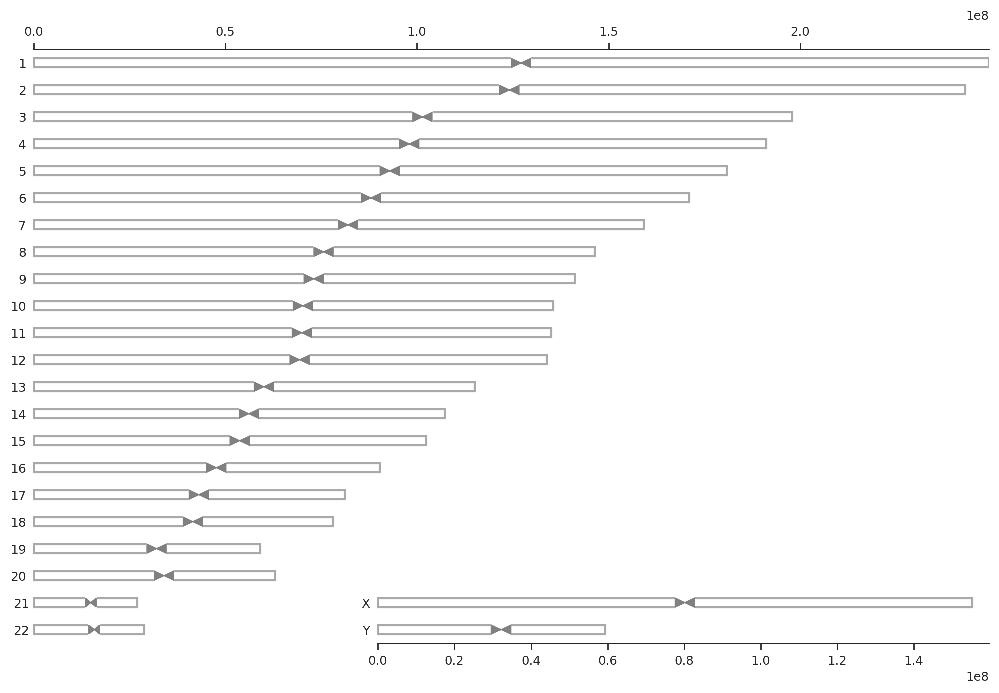

In [4]:
import matplotlib
from matplotlib.patches import Rectangle, Polygon

nr_rows, nr_cols = len(chr_names)-2, 2
with sns.color_palette("Set1"):
    with sns.axes_style('white'): # whitegrid, ticks
        with sns.plotting_context('paper', font_scale=1): # paper, notebook, talk”, poster
            fig = plt.figure(figsize = (10,7))

            
            gs = matplotlib.gridspec.GridSpec(nr_rows, 25)
            gs.update(wspace=0.0, hspace=0.0) # set the spacing between axes.             
            ax_list = [plt.subplot(gs[i, :]) for i in range(nr_rows-2)]
            ax_list.append(plt.subplot(gs[nr_rows-2, :9]))
            ax_list.append(plt.subplot(gs[nr_rows-1, :9]))
            ax_list.append(plt.subplot(gs[nr_rows-2, 9:]))
            ax_list.append(plt.subplot(gs[nr_rows-1, 9:]))

            chr_axes = dict(zip(chr_names, ax_list))
            
            for ax in ax_list[:-4]:
                ax.set_xlim((-100000, figwidth+100000))
            for ax in ax_list[-4:]:
                ax.set_xlim((-100000, ((25-9)/25)*figwidth+100000))

            for i in range(len(ax_list)):
                chrom = chr_names[i]
                ax = ax_list[i]
                start, end = 0, chr_lens[i] 
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                ax.set_ylim((0, 3))
                
                ax.text(-2000000, 1, chrom.replace('chr', ''), fontsize=9, horizontalalignment='right')

                # h = ax.set_ylabel(chrom)
                # h.set_rotation(0)
                ax.set_yticklabels([])

                if i == 0:
                    ax.spines['top'].set_visible(True)
                    ax.xaxis.tick_top()
                    ax.xaxis.set_label_position('top') 
                elif i == len(ax_list)-1:
                    ax.xaxis.tick_bottom()
                    ax.spines['bottom'].set_visible(True)                    
                else:
                    ax.set_xticklabels([])

                
                # draw chrom
                g = ax.add_patch(Rectangle((start, 1), end-start, 1, 
                                           fill=False,
                                           color='darkgrey',
                                           edgecolor=None,
                                           zorder=1, linewidth=1.5
                                          ))
                
                # draw centromere
                cent_start, cent_end = centromeres[chrom]
                
                ax.add_patch(Rectangle((cent_start, 0), cent_end-cent_start, 3, 
                                           fill=True, color='white',
                                           zorder=2))
                
                xy = [[cent_start, 1], [cent_start, 2], [cent_end, 1], [cent_end, 2]]
                g = ax.add_patch(Polygon(xy, closed=True, zorder=3, fill=True, color='grey'))

                
                
#             for chrom, gr in circ_data.groupby('chr'):
#                 chrom = chrom.replace('chr', '')
#                 if chrom in chr_axes:
#                     g = chr_axes[chrom.replace('chr', '')].scatter(gr.start+(gr.end-gr.start)/2, 
#                                                                    numpy.repeat(1, len(gr.start)),
#                                                                    color='red', marker='x', zorder=2)

#             min_run_len = 1
#             for tup in human_chimp_ils.loc[lambda df: df.run >= min_run_len].itertuples():
#                 g = chr_axes[tup.chrom].add_patch(Rectangle((tup.start, 2), tup.end-tup.start, 0.5, 
#                                            fill=True, color='red',
#                                            zorder=4))
#             for tup in human_orang_ils.loc[lambda df: df.run >= min_run_len].itertuples():
#                 g = chr_axes[tup.chrom].add_patch(Rectangle((tup.start, 0.5), tup.end-tup.start, 0.5, 
#                                            fill=True, color='blue',
#                                            zorder=4))
                

#             for tup in circ_data.itertuples():
#                 g = chr_axes[tup.chrom].add_patch(Rectangle((tup.start, 1), tup.end-tup.start, 1, 
#                                            fill=True, color='black',
#                                            zorder=5))
                
#                 g = chr_axes[name].plot(tup.start+(tup.end-tup.start)/2, 2, 'bo', markersize=5, zorder=2)
#                 g = chr_axes[name].scatter(tup.start+(tup.end-tup.start)/2, 1, color='red', marker='x', zorder=2)

#                 g = chr_axes[name].plot(tup.start+(tup.end-tup.start)/2, 1, 'rX', markersize=5, zorder=2)
    
plt.tight_layout()
#mpld3.display(fig)

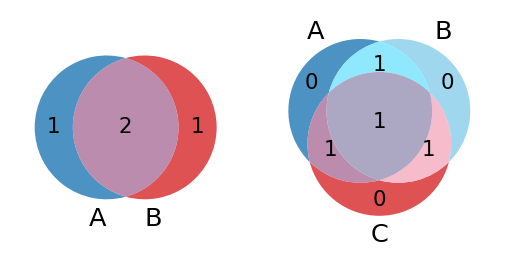

In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(3,3))
g = venn2([set([1, 2, 3]),  set([2, 3, 4])], 
          set_labels = ('A', 'B'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'tab:red'),
          ax=ax1
         )
g = venn3([set([1, 2, 3]),  set([2, 3, 4]), set([3, 4, 1])], 
          set_labels = ('A', 'B', 'C'),
          alpha = 0.8, 
          set_colors=('tab:blue', 'skyblue', 'tab:red'),
          ax=ax2     
         )

# from scipy import stats
# stats.binom_test(5, n=15, p=0.01, alternative='greater')

In [6]:
def expr_plot(genes, layer, markersize=20, ci=95, ax=None):
    axes = ax
    df = adata.to_df(layer=layer)
    df['ptime'] = pd.cut(adata.obs.Pseudotime_scaled, include_lowest=True, bins=30)
    df.set_index('ptime', inplace=True)
    df.columns.name = 'gene'
    genes = pd.Series(genes)
    has_data = genes.isin(df.columns)
    missing = genes[~has_data]
    if missing.size:
        print("missing:", missing.tolist())
    genes = genes[has_data]
    plot_df = df[genes].stack().to_frame('expression').reset_index()
    # if axes is None:
    #     plt.figure(figsize=(6,4))
    if len(plot_df.index):
        ax = sns.pointplot(data=plot_df, x='ptime', y='expression', hue='gene', errorbar=('ci', 95), errwidth=1, scale=0.3, ax=axes)
        plt.setp(ax.collections, sizes=[markersize])
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
        ax.axvline(6.5, color='grey', linestyle='dashed')
        ax.axvline(12, color='grey', linestyle='dashed')
        ax.axvline(14.5, color='grey', linestyle='dashed')
        ax.set_ylabel(layer)
        ax.set_xlabel('Pseudo-time')
        if axes is None:
            plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
        else:
            ax.legend(frameon=False, borderaxespad=0.)
    sns.despine()
    return(ax)

def cat_plot(genes, layer, markersize=20, ci=95, ax=None):
    # layer is 'norm_sct' or 'raw_counts'
    axes = ax
    clusters = ['Spermatogonia', 'Leptotene/Zygotene', 'Pachytene', 'Spermatids']    
    df = adata.to_df(layer=layer)
    df['cluster'] = adata.obs.cluster
    df.set_index('cluster', inplace=True)
    df.columns.name = 'gene'
    genes = pd.Series(genes)
    has_data = genes.isin(df.columns)
    missing = genes[~has_data]
    if missing.size:
        print("missing:", missing.tolist())
    genes = genes[has_data]
    plot_df = df.loc[:, genes].stack().to_frame('expression').reset_index()
    if len(plot_df.index):    
        # plt.figure(figsize=(10,5))
        # ax = sns.pointplot(data=plot_df, x='clst', y='exp', hue='gene', order=['SPG', 'SPC', 'SPT'])#, ci=ci, errwidth=1, scale=0.3)
        ax = sns.pointplot(data=plot_df, x='cluster', y='expression', hue='gene', order=clusters, ax=axes)#, ci=ci, errwidth=1, scale=0.3)
        plt.setp(ax.collections, sizes=[markersize])
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
        ax.set_ylabel(layer)
        ax.set_xlabel('Pseudo-time')
        if axes is None:
            plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
        else:
            ax.legend(frameon=False, borderaxespad=0.)        
    sns.despine()
    return ax

def double_expr_plot(genes, markersize=20, ci=95):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
    expr_plot(genes, 'raw_counts', markersize, ci, ax=ax1)
    ax1.legend().set_visible(False)
    expr_plot(genes, 'norm_sct', markersize, ci, ax=ax2)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
    return (ax1, ax2)

def double_cat_plot(genes, markersize=20, ci=95):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
    cat_plot(genes, 'raw_counts', markersize, ci, ax=ax1)
    ax1.legend().set_visible(False)    
    cat_plot(genes, 'norm_sct', markersize, ci, ax=ax2)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)    
    return (ax1, ax2)

# Load Meritxell's expression data

In [7]:
adata_file = "adata_susbet_kasper.h5ad"

In [8]:
adata = sc.read(adata_file)

LAYERS (matrices of counts; cell x gene )

In [9]:
adata.layers["norm_sct"]

array([[-0.15812184, -0.01926548,  1.04929873, ...,  0.58322422,
        -0.60356874, -0.21755656],
       [-0.13626554, -0.01114993, -0.20909682, ..., -1.3248105 ,
        -0.55327467, -1.20926411],
       [ 1.06187169, -0.02270227,  1.46272279, ..., -1.44290413,
        -0.62436029, -0.35891916],
       ...,
       [-0.13256583, -0.00976892, -0.52701381, ..., -1.30924448,
        -0.5445973 , -1.19408726],
       [-0.09576617,  0.00421229, -0.44994874, ..., -1.13917029,
        -0.45648362, -1.03000332],
       [-0.09846557,  0.00316564, -0.46601452, ..., -1.15243667,
        -0.46302499, -1.04270391]])

In [10]:
adata#.layers["raw_counts"]

AnnData object with n_obs × n_vars = 10370 × 26325
    obs: 'DATASET', 'clst_groups', 'Pseudotime_scaled', 'cell_class', 'enrich_rate_scaled', 'cluster'
    var: 'gene_ids', 'feature_types', 'chromosome'
    uns: 'DATASET_colors', 'DE_leiden', 'cell_class_colors', 'clst_groups_colors', 'cluster_colors', 'dendrogram_cluster', 'diffmap_evals', 'iroot', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_diffmap', 'X_pca', 'X_pca_std', 'X_umap'
    varm: 'PCs'
    layers: 'norm_sct', 'raw_counts'
    obsp: 'connectivities', 'distances'

Cell names

In [11]:
adata.obs_names

Index(['SN111_AAACCTGGTGGACGAT', 'SN111_AAACGGGAGCCAGGAT',
       'SN111_AAACGGGCAGCTTAAC', 'SN111_AAACGGGGTACCCAAT',
       'SN111_AAAGATGAGCCTATGT', 'SN111_AAAGATGCAGTAACGG',
       'SN111_AAAGTAGAGCCTTGAT', 'SN111_AAAGTAGTCTACCTGC',
       'SN111_AAATGCCAGAGCCTAG', 'SN111_AACACGTCAAGTAGTA',
       ...
       'SN142_highseq_TTGCGTCAGATCACGG', 'SN142_highseq_TTGCGTCCACATTTCT',
       'SN142_highseq_TTGGCAAGTAGAAGGA', 'SN142_highseq_TTGTAGGCAGTAACGG',
       'SN142_highseq_TTTACTGTCAGGCAAG', 'SN142_highseq_TTTATGCTCCGCTGTT',
       'SN142_highseq_TTTCCTCAGTATGACA', 'SN142_highseq_TTTGCGCTCCTAGAAC',
       'SN142_highseq_TTTGTCAAGACGACGT', 'SN142_highseq_TTTGTCAAGTGTTGAA'],
      dtype='object', length=10370)

Cell X,Y,DIPL annot

In [12]:
adata.obs["cell_class"]

SN111_AAACCTGGTGGACGAT            DIPL
SN111_AAACGGGAGCCAGGAT            DIPL
SN111_AAACGGGCAGCTTAAC            DIPL
SN111_AAACGGGGTACCCAAT            DIPL
SN111_AAAGATGAGCCTATGT            DIPL
                                  ... 
SN142_highseq_TTTATGCTCCGCTGTT       Y
SN142_highseq_TTTCCTCAGTATGACA       X
SN142_highseq_TTTGCGCTCCTAGAAC       X
SN142_highseq_TTTGTCAAGACGACGT       Y
SN142_highseq_TTTGTCAAGTGTTGAA       X
Name: cell_class, Length: 10370, dtype: category
Categories (3, object): ['DIPL', 'X', 'Y']

All cell annot

In [13]:
adata.obs.head()

,DATASET,clst_groups,Pseudotime_scaled,cell_class,enrich_rate_scaled,cluster
SN111_AAACCTGGTGGACGAT,HUM_2,SPG,0.000000,DIPL,NaN,Spermatogonia
SN111_AAACGGGAGCCAGGAT,HUM_2,SPG,0.092595,DIPL,NaN,Spermatogonia
SN111_AAACGGGCAGCTTAAC,HUM_2,SPG,0.062889,DIPL,NaN,Spermatogonia
SN111_AAACGGGGTACCCAAT,HUM_2,SPC,0.473230,DIPL,NaN,Pachytene
SN111_AAAGATGAGCCTATGT,HUM_2,SPG,0.048667,DIPL,NaN,Spermatogonia


Gene names

In [14]:
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'LOC100996442', 'LOC729737', 'LOC107985721',
       'LOC112268260', 'LOC100132287', 'LOC105378947', 'OR4F16',
       'LOC100288069',
       ...
       'ND2', 'COX1', 'COX2', 'ATP6', 'COX3', 'ND3', 'ND4L', 'ND4', 'ND5',
       'CYTB'],
      dtype='object', length=26325)

Chromosomes

In [15]:
adata.var["chromosome"]

MIR1302-2HG      1
FAM138A          1
LOC100996442     1
LOC729737        1
LOC107985721     1
                ..
ND3             MT
ND4L            MT
ND4             MT
ND5             MT
CYTB            MT
Name: chromosome, Length: 26325, dtype: category
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [16]:
clusters = ['Spermatogonia', 'Leptotene/Zygotene', 'Pachytene', 'Spermatids']

In [17]:
# from openpyxl import load_workbook
# wb = load_workbook(filename = 'Supplementary_tables.xlsx')
# print (wb.sheetnames)

In [18]:
# sheet_ranges = wb['range names']
# print(sheet_ranges['D18'].value)

In [19]:
# data = wb.worksheets[wb.sheetnames.index('Supplementary table 10')].values
# columns = next(data)[0:]
# df = pd.DataFrame(data, columns=columns)
# swept_meritxell_diffexp_genes = df.loc[(df.diff_exp_Human == 'X') & (df.overlap.str.startswith('sweep'))]
# swept_meritxell_diffexp_genes

**Chromosome 3 regions genes with pachytene peak:**

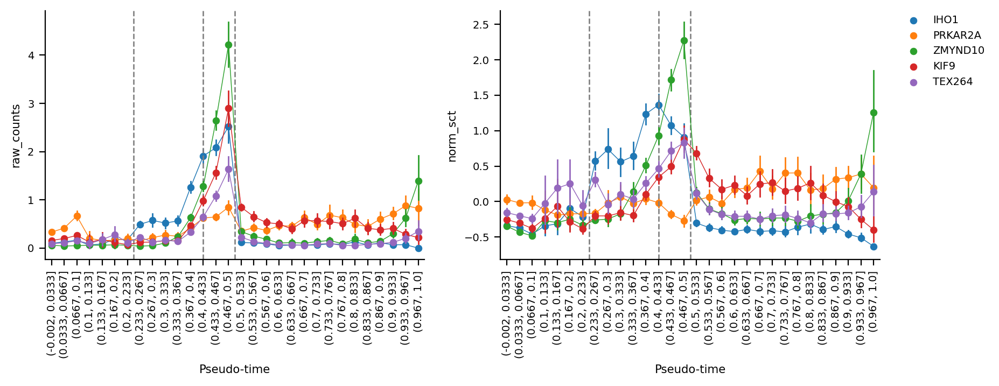

In [20]:
double_expr_plot(['IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']) ;

# Gene sets

In [43]:
top_diff_exp = pd.read_csv('xy_deg/mast_output_flt_HUM.tsv', sep='\t')
#top_diff_exp.diff_exp.unique()
top_diff_exp.head(20)

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
0,UPF3B,1.011245e-193,1.382583,2.660789e-189,UPF3B,UPF3B,X,1.605808,-0.144114,0.377143,0.051613
1,PPP1R2C,7.204536e-129,1.281958,9.478287e-125,PPP1R2C,PPP1R2C,X,3.007225,0.131660,0.352273,0.058065
2,FAM230C,1.767933e-110,-1.550552,1.550596e-106,FAM230C,FAM230C,Y,0.491259,3.901789,0.176136,0.551948
3,amplicon-chrY-HSFY1/2,8.518387e-107,-0.840898,5.603395e-103,mc/ampl_HSFY1/2,mc/ampl_HSFY1/2,Y,0.275991,2.021264,0.022857,0.167742
4,LINC00278,1.075359e-105,-0.629148,5.658972e-102,LINC00278,LINC00278,Y,-0.133808,1.455366,0.005714,0.090323
5,TTTY2,7.492789e-95,-0.668720,3.285838e-91,TTTY2,TTTY2,Y,-0.095212,1.554767,0.000000,0.038710
6,DIAPH2,1.270946e-80,1.289335,4.777303e-77,DIAPH2,DIAPH2,X,0.367308,-0.453516,0.232955,0.038961
7,SCML1,6.146003e-79,1.011064,2.021420e-75,SCML1,SCML1,X,0.743875,-0.342515,0.159091,0.012987
8,LOC105377227,7.506654e-78,-0.907516,2.194612e-74,LOC105377227,LOC105377227,Y,0.056067,1.276232,0.005682,0.058442
9,amplicon-chrY-CDY1/1B/2A/2B,1.049046e-77,-1.130319,2.760250e-74,mc/ampl_CDY1/1B/2A/2B,mc/ampl_CDY1/1B/2A/2B,Y,-0.022583,2.430483,0.005714,0.071429


In [66]:
chrX_genes = gi.get_genes_region_dataframe('chrX', 0, 156000000, assembly='hg19').drop_duplicates('name')
chrY_genes = gi.get_genes_region_dataframe('chrY', 0, 156000000, assembly='hg19').drop_duplicates('name')
chrX_genes.head()

,name,start,end,strand
0,PLCXD1,193022,220023,+
7,GTPBP6,221425,230887,-
8,LINC00685,281384,282067,+
10,PPP2R3B,294667,347642,-
11,SHOX,585078,620146,+


In [75]:
df = top_diff_exp.loc[~top_diff_exp.gene_name.isin(chrX_genes.name) & ~top_diff_exp.gene_name.isin(chrY_genes.name) & (top_diff_exp.diff_exp != 'No-significant')].sort_values('coef')
df << left()

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
2,FAM230C,0.000000,-1.550552,0.000000,FAM230C,FAM230C,Y,0.491259,3.901789,0.176136,0.551948
9,amplicon-chrY-CDY1/1B/2A/2B,0.000000,-1.130319,0.000000,mc/ampl_CDY1/1B/2A/2B,mc/ampl_CDY1/1B/2A/2B,Y,-0.022583,2.430483,0.005714,0.071429
8,LOC105377227,0.000000,-0.907516,0.000000,LOC105377227,LOC105377227,Y,0.056067,1.276232,0.005682,0.058442
3,amplicon-chrY-HSFY1/2,0.000000,-0.840898,0.000000,mc/ampl_HSFY1/2,mc/ampl_HSFY1/2,Y,0.275991,2.021264,0.022857,0.167742
61,amplicon-chrY-VCY/1B,0.000000,-0.742794,0.000000,mc/ampl_VCY/1B,mc/ampl_VCY/1B,Y,-0.349380,0.201214,0.022727,0.103226
36,LOC107987339,0.000000,-0.667607,0.000000,LOC107987339,LOC107987339,Y,-0.043290,1.443559,0.000000,0.019481
104,LOC105377231,0.000000,-0.595544,0.000000,LOC105377231,LOC105377231,Y,0.061306,0.766494,0.000000,0.006494
234,amplicon-chrY-RBMY1A1/1B/1D/1E/1F/1J,0.000005,-0.560468,0.000545,mc/ampl_RBMY1A1/1B/1D/1E/1F/1J,mc/ampl_RBMY1A1/1B/1D/1E/1F/1J,Y,-0.329864,-0.162775,0.011429,0.045161
113,DACT3-AS1,0.000000,-0.555422,0.000000,DACT3-AS1,DACT3-AS1,Y,1.844904,3.417205,0.312500,0.554839
58,LOC107987394,0.000000,-0.551988,0.000000,LOC107987394,LOC107987394,Y,0.501233,2.289808,0.080000,0.253247


# MAKE PLOT THAT STRATIFIES BY X AND Y CELLS. (RAW X COUNTS AT PEUDOTIME DVIDEDE BY RAW X COUNTS FOR ALL OTHER GENES IN THE CELL (OR SOME OTHER GROUPS))

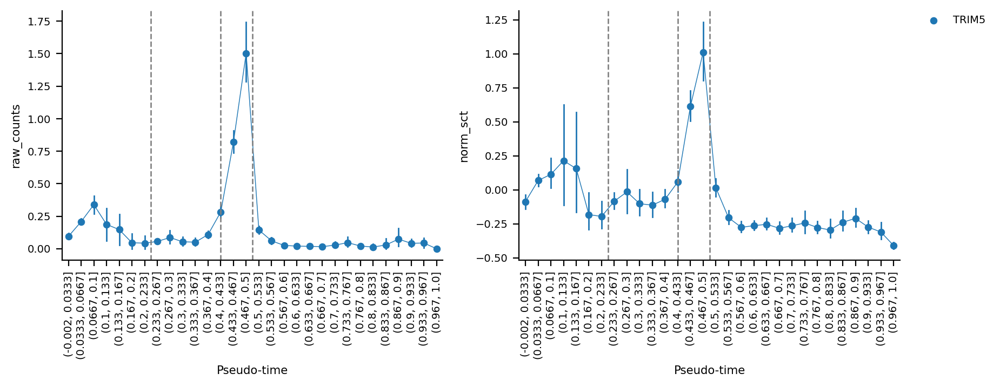

In [77]:
double_expr_plot(['TRIM5']) ;

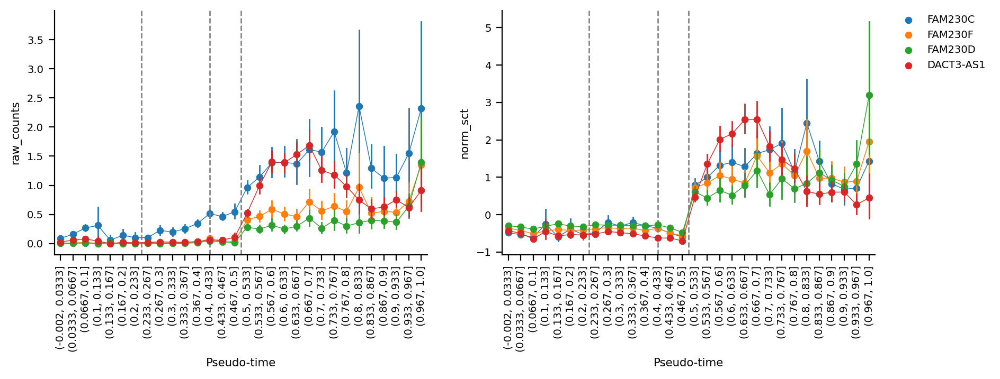

In [74]:
double_expr_plot(['FAM230C', 'FAM230F', 'FAM230D', 'DACT3-AS1']) ;

In [59]:
chr3_region_genes = gi.get_genes_region_dataframe('chr3', 48000000, 52000000, assembly='hg19').drop_duplicates('name')

In [62]:
top_diff_exp.loc[top_diff_exp.gene_name.isin(chr3_region_genes.name)] << left()

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
520,IQCF6,0.002065,-0.000084,0.104281,IQCF6,nan,No-significant,nan,nan,nan,nan
629,CAMKV,0.003745,-0.000018,0.156395,CAMKV,nan,No-significant,nan,nan,nan,nan
700,LINC02585,0.005402,-0.070891,0.202605,LINC02585,nan,No-significant,nan,nan,nan,nan
710,RBM5,0.005599,-0.041909,0.207133,RBM5,nan,No-significant,nan,nan,nan,nan
744,HEMK1,0.006294,-0.005299,0.222285,HEMK1,nan,No-significant,nan,nan,nan,nan
779,PCBP4,0.007051,-0.000001,0.237853,PCBP4,nan,No-significant,nan,nan,nan,nan
832,PRKAR2A-AS1,0.008393,-0.056443,0.264735,PRKAR2A-AS1,nan,No-significant,nan,nan,nan,nan
1180,NCKIPSD,0.018097,-0.071589,0.403003,NCKIPSD,nan,No-significant,nan,nan,nan,nan
1304,C3orf18,0.021698,-0.001254,0.437483,C3orf18,nan,No-significant,nan,nan,nan,nan
1737,MST1R,0.036952,-0.000044,0.559098,MST1R,nan,No-significant,nan,nan,nan,nan


In [28]:
for g in ['CCDC36', 'IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']:
    print(g, g in top_diff_exp.gene_name)

CCDC36 False
IHO1 False
PRKAR2A False
ZMYND10 False
KIF9 False
TEX264 False


In [ ]:
['IHO1', 'PRKAR2A', 'ZMYND10', 'KIF9', 'TEX264']

### Questions:

- Are (all) X genes with a homolog on Y more often DEGs or is it only the ASF ones?
- Are there any autosomal DEGs, and do they interact with DEGs on X and Y?
- Are DEGs enriched among ASF genes or is it only those without admixture or with ILS or sweeps?
- Is there a significant correlation between DE, pachytene peak, seelction and ASF?

In [36]:
xy_homologs_in_sfari = [
        'DDX3X', 'DDX3Y',
        'EIF1AX', 'EIF1AY',
        'RBMX', 'RBMY',
        'TMSB4X', 'TMSB4Y',
        'USP9X', 'USP9Y',
        'KMD6A',
        'KMD5C',
        'NLGN4X', 
        'TBL1X', 'TBL1Y',
        'PCDH11X', 'PCDH11Y'
    ]

[Loss of KDM6A Activates Super-Enhancers to Induce Gender-Specific Squamous-like Pancreatic Cancer and Confers Sensitivity to BET Inhibitors](https://www.sciencedirect.com/science/article/pii/S1535610818300564?via%3Dihub)

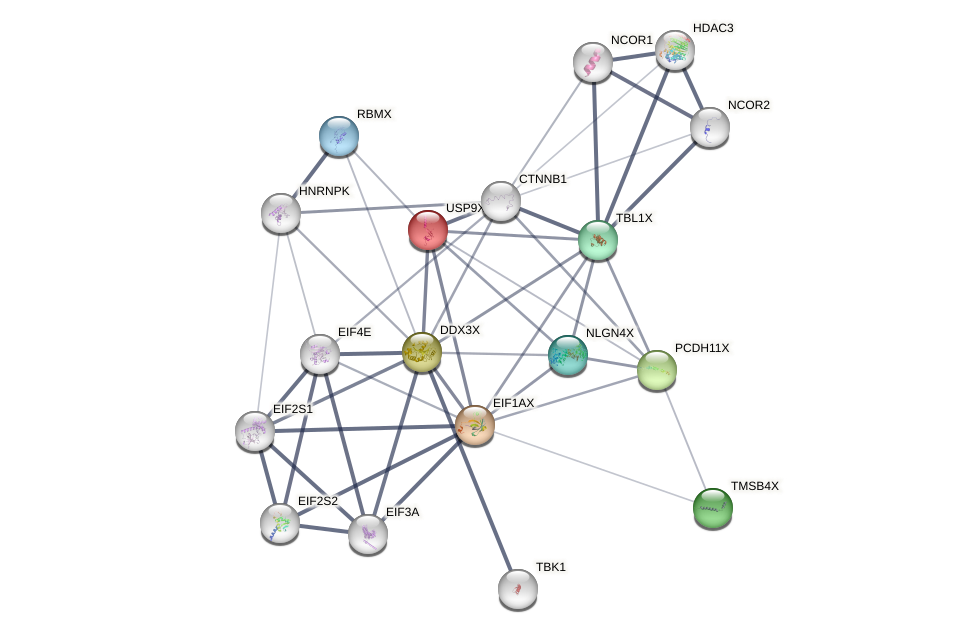

In [137]:
gi.show_string_network(xy_homologs_in_sfari)

In [87]:
top_diff_exp.loc[top_diff_exp.gene_name.isin(['KDM6A', 'RUNX3', 'UTY')].sort_values('gene_name')

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
241,KDM6A,0.000007,0.159901,0.000772,KDM6A,KDM6A,X,-0.154221,-0.243004,0.022857,0.012903
793,RUNX3,0.007429,-0.177379,0.246177,RUNX3,NaN,No-significant,NaN,NaN,NaN,NaN
24012,UTY,0.919130,0.005003,1.000000,UTY,NaN,No-significant,NaN,NaN,NaN,NaN


In [77]:
top_diff_exp.loc[top_diff_exp.gene_name.isin(xy_homologs_in_sfari)].sort_values('gene_name')

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
52,DDX3X,1.497812e-37,0.209078,7.435930e-35,DDX3X,DDX3X,X,0.716006,-0.004894,0.073864,0.032258
19,DDX3Y,1.371331e-63,-0.590866,1.804123e-60,DDX3Y,DDX3Y,Y,-0.054413,0.526727,0.022727,0.064935
120,EIF1AX,8.146251e-15,0.172135,1.771439e-12,EIF1AX,EIF1AX,X,0.264888,0.029644,0.068182,0.038710
182,EIF1AY,5.849542e-09,-0.555201,8.410555e-07,EIF1AY,EIF1AY,Y,0.137361,0.431974,0.028571,0.051613
1307,NLGN4X,2.176844e-02,0.033015,4.377381e-01,NLGN4X,NaN,No-significant,NaN,NaN,NaN,NaN
498,PCDH11X,1.712805e-03,0.047935,9.031530e-02,PCDH11X,NaN,No-significant,NaN,NaN,NaN,NaN
238,PCDH11Y,5.441320e-06,-0.164082,5.990461e-04,PCDH11Y,PCDH11Y,Y,0.008382,0.299661,0.011364,0.032258
151,RBMX,1.382310e-11,0.421526,2.392851e-09,RBMX,RBMX,X,0.019181,-0.212089,0.011364,0.006452
4282,TBL1X,1.352878e-01,0.021555,8.300779e-01,TBL1X,NaN,No-significant,NaN,NaN,NaN,NaN
13800,TBL1Y,5.284401e-01,-0.018782,1.000000e+00,TBL1Y,NaN,No-significant,NaN,NaN,NaN,NaN


CFAP47 "associate" with CFAP65 in STRING (and PCDH11X which is is sfari)

In [101]:
top_diff_exp.loc[top_diff_exp.gene_name == 'CFAP65']

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
1424,CFAP65,0.02581,-0.222513,0.476209,CFAP65,NaN,No-significant,NaN,NaN,NaN,NaN


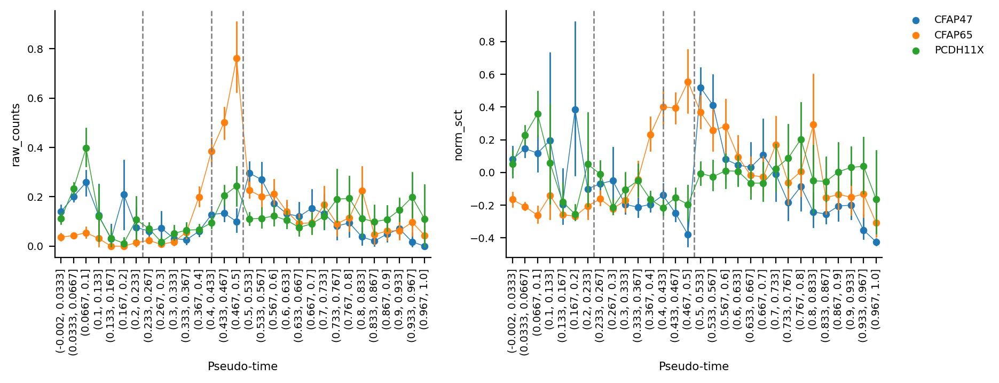

In [134]:
double_expr_plot(['CFAP47', 'CFAP65', 'PCDH11X']) ;

CFAP65:

[A novel homozygous CFAP65 mutation in humans causes male infertility with multiple morphological abnormalities of the sperm flagella](https://onlinelibrary.wiley.com/doi/10.1111/cge.13644)

[Connecting phenotype to genotype: PheWAS-inspired analysis of autism spectrum disorder
](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC9605200/)

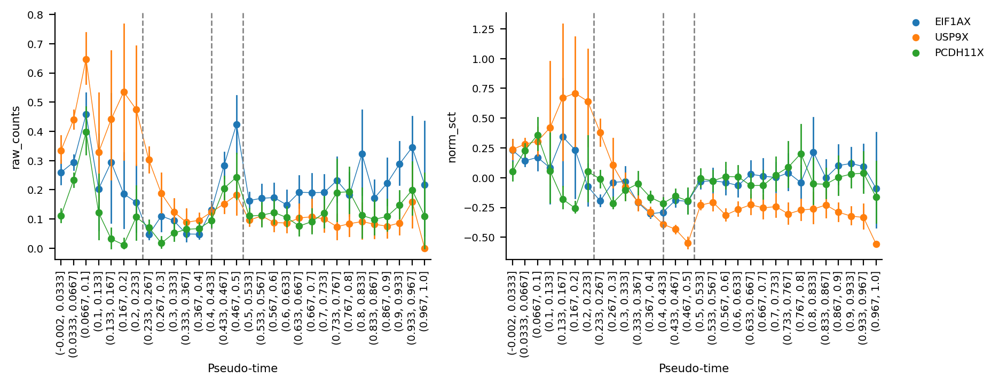

In [129]:
double_expr_plot(['EIF1AX', 'USP9X', 'PCDH11X']) ;

missing: ['RBMY', 'TMSB4Y', 'KMD6A', 'KMD5C']
missing: ['RBMY', 'TMSB4Y', 'KMD6A', 'KMD5C']


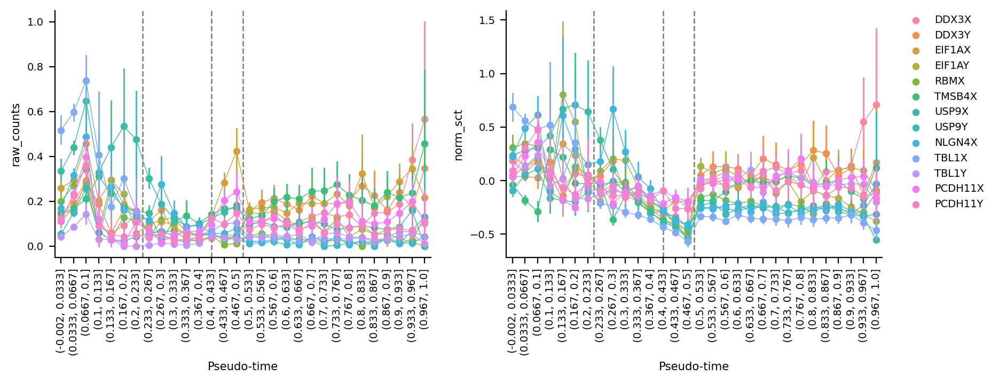

In [130]:
double_expr_plot(xy_homologs_in_sfari) ;

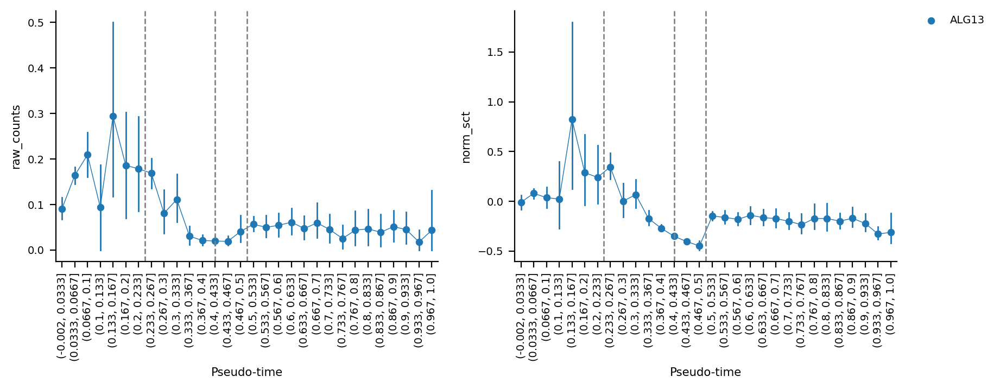

In [132]:
double_expr_plot('ALG13') ;

DEG PPI sets (Experiments, Databases, Gene Fusion, Co‑occurrence):

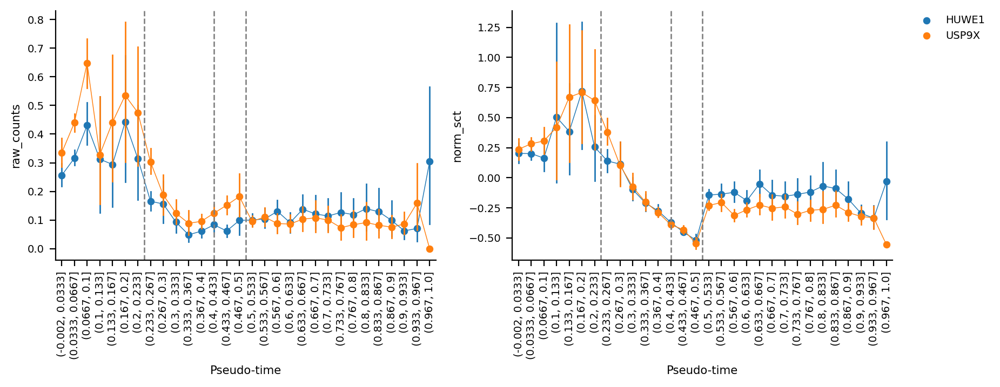

In [145]:
double_expr_plot(['HUWE1', 'USP9X']) ;

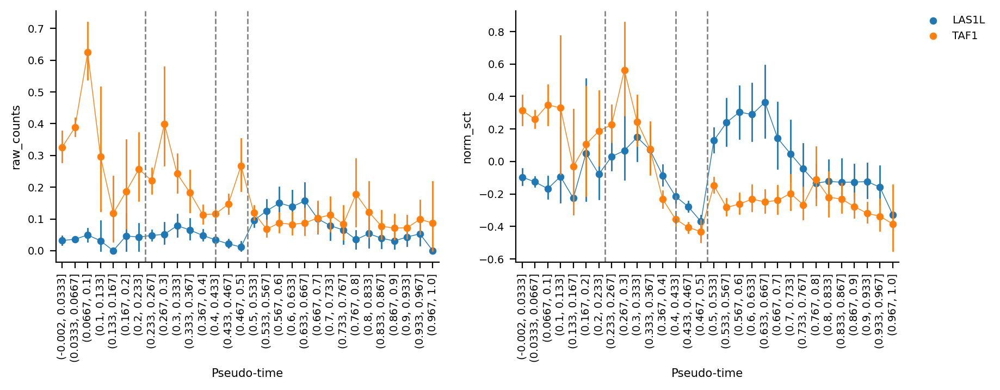

In [154]:
double_expr_plot(['LAS1L', 'TAF1']) ;

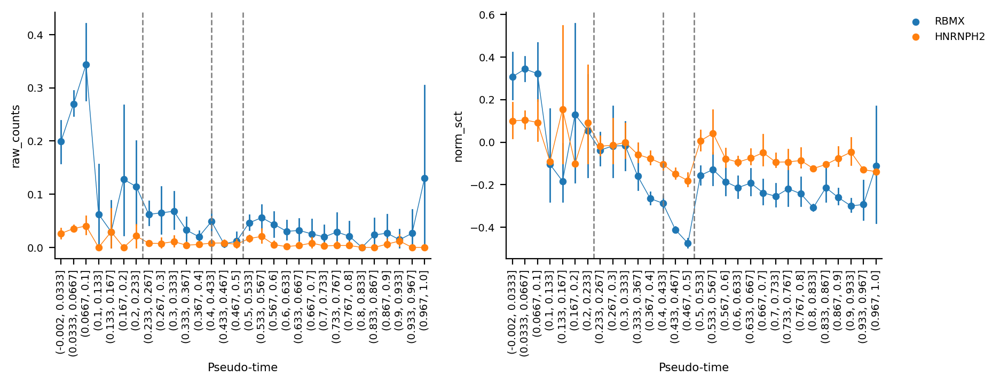

In [149]:
double_expr_plot(['RBMX', 'HNRNPH2']) ;

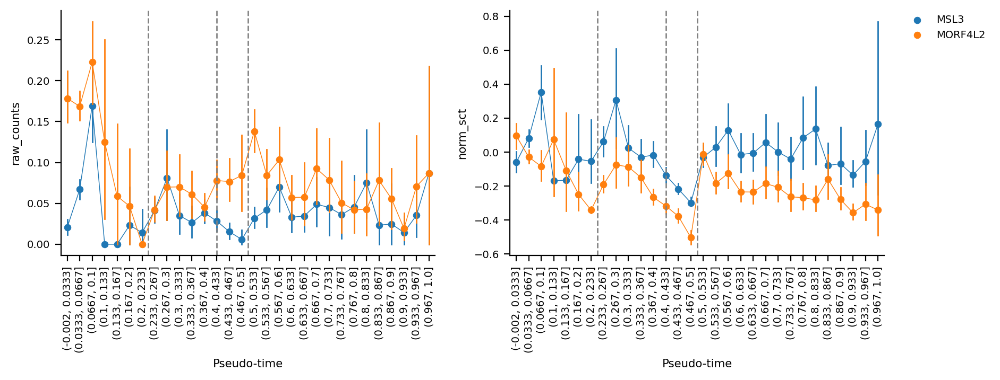

In [151]:
double_expr_plot(['MSL3', 'MORF4L2']) ;

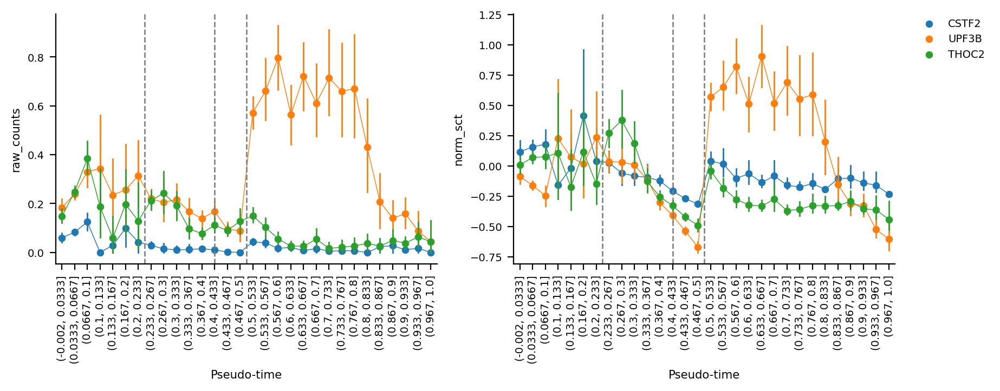

In [152]:
double_expr_plot(['CSTF2', 'UPF3B', 'THOC2']) ;

In [144]:
# for g in top_diff_exp.loc[top_diff_exp.diff_exp != 'No-significant'].sort_values('coef', ascending=False).gene_name.values:
#     print(g)

MAGEA4-AS1
LOC105373313
UPF3B
LOC105373153
DIAPH2
PPP1R2C
GLA
EDA
CFAP47
LOC107985717
OTUD6A
CBLL2
SCML1
GSPT2
OFD1
LINC00894
mc/ampl_BIG-FAMILY-B
HDX
mc/ampl_FAM47A/B/C
BRWD3
mc/ampl_NXF2/2B/5
EFHC2
RBM41
mc/ampl_DDX53
TSC22D3
RTL4
SLC7A3
CHIC1
CYLC1
LINC00893
NUP62CL
PHF6
LOC105373188
mc/ampl_CXorf49/B
NCBP2L
SLC25A53
BCLAF3
RPGR
ZMAT1
IDS2
VSIG4
LL0XNC01-250H12.3
PPEF1
THOC2
MAP7D3
ATRX
GPM6B
mc/ampl_MAGEA12/A2/A2B/A3/A6
PTCHD1
PNMA6E
MAOA
IL1RAPL2
mc/ampl_F8/F8A1/2/3/H2AB1/2/3
AFF2
MAGEA6-DT
HTR2C
SLC25A14
PIM2
MORF4L2
MPC1L
TFDP3
mc/ampl_CPXCR1
IGBP1
GUCY2F
LOC107985675
LAS1L
CSTF2
LOC101928128
CXorf58
TEX11
PHKA2
LOC107985694
LOC105377209
TRIM5
SYTL5
FRMPD4
HDAC6
LOC105373292
mc/ampl_EOLA1/2/HSFX3/4
RPA4
RP2
OCRL
LOC105373155
TGIF2LX
CXorf66
GK
H2AP
PHF8
PABIR3
LOC105373137
PCYT1B
HUWE1
ZDHHC9
PDK3
CLDN34
LINC01203
TENT5D
mc/ampl_MAGEB6
ZCCHC13
GLOD5
mc/ampl_CXorf51A/B
TKTL1
LOC102724150
RBMX
BEX2
LOC105373174
TRMT2B
LOC105373298
CDKL5
HNRNPH2
GRIPAP1
ATP11C
mc/ampl_ETD1/B/ZNF75D

In [108]:
top_diff_exp.loc[top_diff_exp.diff_exp != 'No-significant'].sort_values('coef', ascending=False)

AttributeError: 'DataFrame' object has no attribute 'diff_exp'

In [37]:
top_diff_exp.loc[top_diff_exp.diff_exp != 'No-significant'].sort_values('coef', ascending=False).head(20) << left()

,primerid,Pr(>Chisq),coef,FDR,gene_name,signif,diff_exp,prop_exp_X,prop_exp_Y,prop_exp_raw_X,prop_exp_raw_Y
29,MAGEA4-AS1,0.000000,2.365739,0.000000,MAGEA4-AS1,MAGEA4-AS1,X,2.038899,-0.077053,0.102273,0.006452
31,LOC105373313,0.000000,1.440591,0.000000,LOC105373313,LOC105373313,X,2.197796,0.078523,0.142045,0.012903
0,UPF3B,0.000000,1.382583,0.000000,UPF3B,UPF3B,X,1.605808,-0.144114,0.377143,0.051613
24,LOC105373153,0.000000,1.348723,0.000000,LOC105373153,LOC105373153,X,1.360874,-0.263251,0.164773,0.006452
6,DIAPH2,0.000000,1.289335,0.000000,DIAPH2,DIAPH2,X,0.367308,-0.453516,0.232955,0.038961
1,PPP1R2C,0.000000,1.281958,0.000000,PPP1R2C,PPP1R2C,X,3.007225,0.131660,0.352273,0.058065
132,GLA,0.000000,1.230274,0.000000,GLA,GLA,X,0.786905,-0.025771,0.028409,0.000000
43,EDA,0.000000,1.209988,0.000000,EDA,EDA,X,0.943742,-0.121673,0.137143,0.025806
16,CFAP47,0.000000,1.141357,0.000000,CFAP47,CFAP47,X,1.161763,-0.145954,0.125000,0.019355
22,LOC107985717,0.000000,1.076459,0.000000,LOC107985717,LOC107985717,X,1.296817,-0.177197,0.113636,0.006452


X genes with expression data:

In [38]:
x_genes_with_expr_data = set(adata.var["chromosome"][adata.var["chromosome"] == 'X'].index.values)

Top differentially expressed from Meritxell:

In [39]:
top_diff_exp = pd.read_csv('DEG_XY_spermatids_filtered_pval1_fc2.tsv', sep='\t', 
            names=['name', '?', 'log_ratio', '??'])

SFARI genes:

In [40]:
sfari_genes = pd.read_csv('SFARI-Gene_genes_05-05-2022release_06-27-2022export.csv')

CodeML significant genes from Tessa's PiB:

In [41]:
codeml_tessa = pd.read_csv('tessa_codeml_genes.csv', names=['name', 'alt_model', 'LR', 'pval'])

Grove ASD genes:

In [42]:
grove_2019 = ['KIZ', 'XRN2', 'NKX2-2', 'NKX2-4', 'C8orf74', 
              'SOX7', 'PINX1', 'LOC102723661', 'PTBP2', 
              'MACROD2', 'KMT2E', 'SRPK2', 'MMS22L', 'POU3F2',
              'NUD12', 'MROH5', 'CADPS', 'NEGR1', 'MARK3', 'CKB', 
              'TRMT61A', 'BAG5', 'APOPT1', 'KLC1', 'XRCC3', 
              'SLC30A9', 'BEND4', 'TMEM33', 'DCAF4L1']

X genes in low-ILS regions:

In [43]:
human_chimp_low_ils_chrX = pd.read_hdf('human_chimp_low_ils_regions_chrX.hdf')
genes_human_chimp_low_ils_chrX = []
for start, end in zip(human_chimp_low_ils_chrX.start, human_chimp_low_ils_chrX.end):
    entries = gi.get_genes_region('chrX', start, end, assembly='hg19')
    genes_human_chimp_low_ils_chrX.extend(list(set(list(zip(*entries))[0])))

In [44]:
human_orang_low_ils_chrX = pd.read_hdf('human_orang_low_ils_regions_chrX.hdf')
genes_human_orang_low_ils_chrX = []
for start, end in zip(human_orang_low_ils_chrX.start, human_orang_low_ils_chrX.end):
    entries = gi.get_genes_region('chrX', start, end, assembly='hg19')
    genes_human_orang_low_ils_chrX.extend(list(set(list(zip(*entries))[0])))

# TODO:

- Try to plot all the SFARI genes, codemml, and spermatogenesis genes on the ideogram, along with low-ILS regions in both HCG and HOG
- codeml selected genes in each expression category and by mean expression at each stage. Are there more with late expression in spermatogenesis? And do these overlap SFARI or brain GTex genes?
- is there an overlap to genes in low-ILS regions?
- Try to plot nr SFARI genes against chrom length
- Try to make an ideogram to plot genes on
- Are there more genes on X than A with GO term including "neuron" or "brain". If so see which genes explain the enrichment.
- What is the overlap between expression in spermatogenesis and brain. Are there more genes with dual roles on X than A?
- Are there more SFARI genes in low-ILS regions?
- Among all brain expressed genes, do suceptibility genes have a characteristic expression profile through spermatogenesis?


- IL13RA1: Peak, *sperm. expression*
- EGFL6: sperm. expression
- OGT: 
- DYNLT3: Peak, *sperm. expression*
- PCDH11X: maybe associated with **AD and fragile X**, *sperm. expression*
- ZDHHC9: associated with **X-linked cognitive disability**., 
- HMGN5: 
- RAB41: 
- OFD1: *sperm. expression*
- EDA: *sperm. expression*
- GK: *sperm. expression*
- LAGE3: A form of Galloway-Mowat syndrome, a severe renal-neurological disease characterized by early-onset nephrotic syndrome associated with microcephaly, **central nervous system abnormalities**, developmental delays, and a propensity for seizures.
- ZNF41: may be associated with X-linked cognitive disability
- PDHA1: Leigh syndrome is a rare genetic **neurometabolic disorder**. It is characterized by the degeneration of the central nervous system (i.e., brain, spinal cord, and optic nerve).
- WWC3: A rare disorder of sex development affecting 46,XY individuals and characterized by **complete gonadal dysgenesis** (normal external female genitalia...
- BRCC3: This complex plays a role in the DNA damage response, where it is responsible for the stable accumulation of BRCA1 at DNA break sites
- BGN: ?

Cadhedrines under selection (checked if sperm. expressed):

- [x] PCDH11X, AD, fragile X
- [ ] PCDHA13
- [ ] PCDHA6
- [ ] PCDHA9 
- [x] PCDHB15 (strong expression in chimps and other primates, not humans), May be involved in the establishment and maintenance of specific neuronal connections in the brain.
- [ ] PCDHGA8
- [ ] PCDHGC3
- [x] PCDHGC5 May be involved in the establishment and maintenance of specific neuronal connections in the brain     
- [x] CDHR2 Intermicrovillar adhesion molecule that forms, via its extracellular domain, calcium-dependent heterophilic complexes with CDHR5 on adjacent microvilli.

# it seems there is a bug in geneinfo so you cannot use background_chrom unless you have already run an analysis withuot it

# Distribution of cell counts across pseudo-time

In [24]:
%matplotlib inline

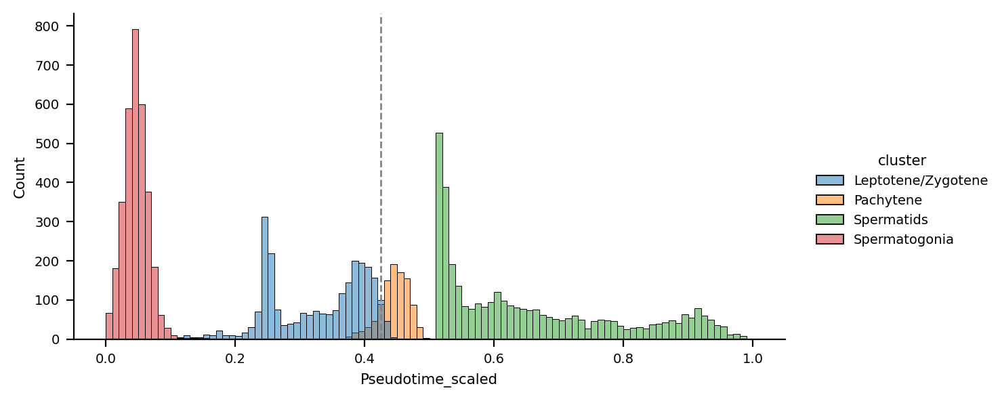

In [45]:
df = sc.get.obs_df(adata, keys=['cluster', 'Pseudotime_scaled'])
sns.displot(df, x='Pseudotime_scaled', hue='cluster', bins=100, height=3, aspect=2) ;
plt.axvline(0.425, color='grey', linestyle='dashed') ;

# Compute norm_sct expression means

In [291]:
adata.var.chromosome

MIR1302-2HG      1
FAM138A          1
LOC100996442     1
LOC729737        1
LOC107985721     1
                ..
ND3             MT
ND4L            MT
ND4             MT
ND5             MT
CYTB            MT
Name: chromosome, Length: 26325, dtype: category
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [399]:
df = adata.to_df(layer='norm_sct')
# df = df.loc[adata.var.chromosome == 'X']
df['ptime'] = pd.cut(adata.obs.Pseudotime_scaled, include_lowest=True, bins=30)
ptime_bins = df['ptime'].unique().sort_values()
means_fine_df = df.groupby('ptime').mean()
means_fine_df.columns.name = 'gene'
means_fine_df = means_fine_df.transpose()
means_fine_df = means_fine_df_fine[ptime_bins]

# only chrX
means_fine_df = means_fine_df.loc[adata.var.chromosome == 'X']

means_fine_df.head()

ptime,"(-0.002, 0.0333]","(0.0333, 0.0667]","(0.0667, 0.1]","(0.1, 0.133]","(0.133, 0.167]","(0.167, 0.2]","(0.2, 0.233]","(0.233, 0.267]","(0.267, 0.3]","(0.3, 0.333]",...,"(0.667, 0.7]","(0.7, 0.733]","(0.733, 0.767]","(0.767, 0.8]","(0.8, 0.833]","(0.833, 0.867]","(0.867, 0.9]","(0.9, 0.933]","(0.933, 0.967]","(0.967, 1.0]"
gene,,,,,,,,,,,,,,,,,,,,,
GYG2,0.013320,0.162852,0.153664,-0.105513,-0.103562,0.163964,-0.079616,-0.064393,-0.099105,-0.064864,...,0.034594,-0.074653,0.116886,-0.073202,-0.123290,-0.084088,0.037497,-0.100138,-0.141711,-0.011975
ARSD,0.051306,0.069367,0.008655,-0.086141,-0.084228,-0.087577,-0.088926,-0.032798,-0.080085,-0.050843,...,-0.099612,-0.099845,-0.103134,-0.097347,-0.101333,0.026941,-0.015032,-0.043603,-0.055052,-0.128201
ARSL,0.063023,-0.016802,0.102967,0.178717,-0.093546,-0.094777,-0.096842,-0.051508,-0.084600,-0.058478,...,-0.088750,-0.091513,0.121692,-0.001074,-0.009786,-0.050826,0.058062,-0.034937,-0.129359,0.062067
ARSH,-0.001131,0.042301,0.107978,0.048469,-0.073433,-0.075903,-0.076965,0.056948,0.071976,0.007075,...,-0.022339,0.064382,0.038611,0.059173,0.008478,-0.078128,-0.082962,-0.043001,-0.099089,0.078078
ARSF,0.023974,0.065903,0.029981,-0.108592,-0.104168,-0.055895,-0.108773,-0.061148,-0.038569,-0.013696,...,-0.010365,-0.092713,0.098239,-0.039301,-0.002062,0.002513,-0.036779,-0.042136,0.043196,-0.156244


In [400]:
# df = adata.to_df(layer='norm_sct')
# df['cluster'] = adata.obs.cluster
# df.set_index('cluster', inplace=True)
# means_df = df.groupby('cluster').mean()
# means_df.columns.name = 'gene'
# means_df = means_df.transpose()
# means_df = means_df[clusters]
# means_df.head()

In [401]:
# df = adata.to_df(layer='raw_counts')
# df['cluster'] = adata.obs.cluster
# df.set_index('cluster', inplace=True)
# raw_means_df = df.groupby('cluster').mean()
# raw_means_df.columns.name = 'gene'
# raw_means_df = raw_means_df.transpose()
# raw_means_df = raw_means_df[clusters]
# raw_means_df.head()

In [402]:
# # %env http_proxy=http://proxyserv:3128
# # %env https_proxy=http://proxyserv:3128
# import geneinfo as gi
# gi.email = 'kaspermunch@birc.au.dk'

In [403]:
# from Bio import Entrez
# gi._assert_entrez_email()
# handle = Entrez.esearch(db="gene", term=f'9606[Taxonomy ID] AND alive[property] AND genetype protein coding[Properties]', retmax="1000000")
# records = Entrez.read(handle)
# id_list = records["IdList"]

In [404]:
# gi._fetch_ids_to_file(id_list, 'all_genes.txt')

In [405]:
# df = pd.read_csv('all_genes.txt', sep='\t')
# x_genes = (df
#            .loc[df.chromosome=='X', ['Symbol', 
#                                     'chromosome', 
#                                     'start_position_on_the_genomic_accession', 
#                                     'end_position_on_the_genomic_accession']]
#  .rename(columns=dict(chromosome='chrom',
#          Symbol='gene',
#          start_position_on_the_genomic_accession='start',
#          end_position_on_the_genomic_accession='end'))
#           )
# x_genes.head()

In [406]:
# df = means_df.reset_index().merge(x_genes, on='gene', how='right').sort_values(by=['start', 'end'])
# df.head()

# K-means clustering

In [407]:
n_clusters = 50
membership_labels = list(range(n_clusters))
X = means_fine_df.values
kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=0).fit(X)
#kmeans.labels_

In [408]:
df = pd.DataFrame().from_records(kmeans.cluster_centers_, columns=means_fine_df.columns)
df.index.name = 'membership'
df.columns.name = 'ptime'
plot_df = df.stack().to_frame('expression').reset_index()
plot_df.tail()

,membership,ptime,expression
1495,49,"(0.833, 0.867]",-0.153099
1496,49,"(0.867, 0.9]",-0.138089
1497,49,"(0.9, 0.933]",-0.186537
1498,49,"(0.933, 0.967]",-0.217048
1499,49,"(0.967, 1.0]",-0.237749


In [409]:
# ax = sns.pointplot(data=plot_df, x='ptime', y='expression', hue='membership', 
#                    errorbar='sd', 
#                   )
# ax.axvline(6.5, color='grey', linestyle='dashed')
# ax.axvline(12, color='grey', linestyle='dashed')
# ax.axvline(14.5, color='grey', linestyle='dashed')
# plt.xticks(rotation=90)
# ax.set_xlabel('Pseudo-time')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
# sns.despine()

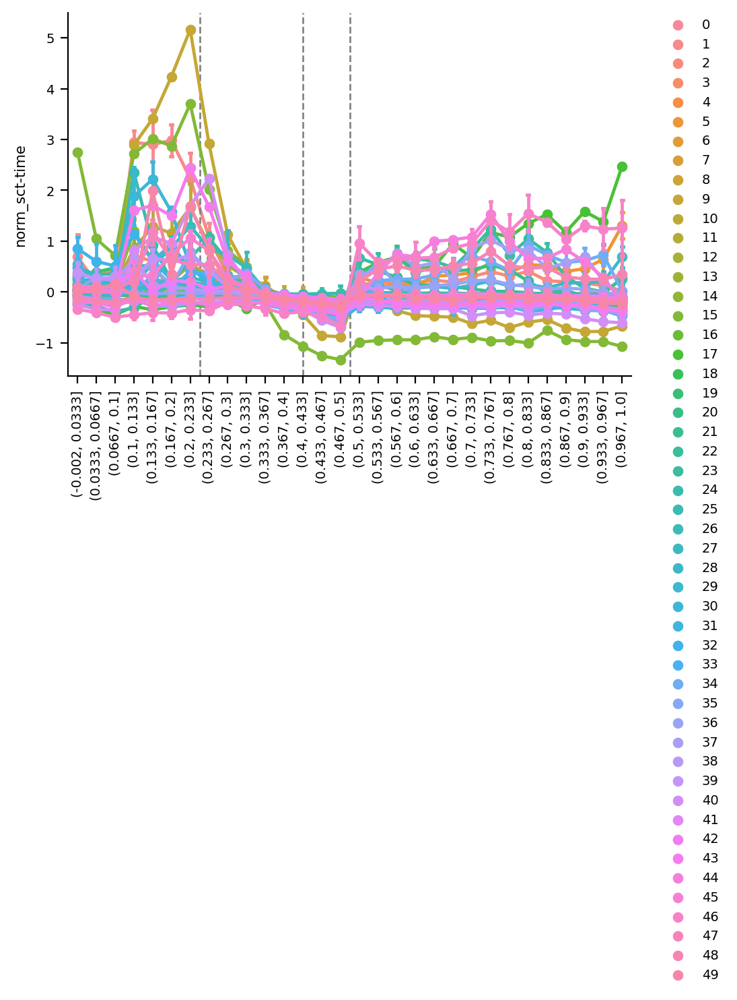

In [410]:
memberships = kmeans.predict(X)

means_fine_df.columns = means_fine_df.columns.tolist() # remvoe categoriesfrom column index

means_fine_df['membership'] = memberships

plot_df = means_fine_df.melt(id_vars=['membership'])

ax = sns.pointplot(data=plot_df, x='variable', y='value', hue='membership', 
                   errorbar='sd', capsize=.1, 
                   order=ptime_bins
                  )
plt.xticks(rotation=90)
ax.axvline(6.5, color='grey', linestyle='dashed')
ax.axvline(12, color='grey', linestyle='dashed')
ax.axvline(14.5, color='grey', linestyle='dashed')
ax.set_ylabel('norm_sct-time')
ax.set_xlabel(None)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
sns.despine()

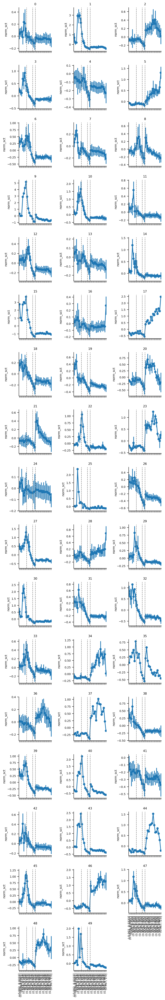

In [411]:
g = sns.FacetGrid(plot_df, col="membership", height=2, col_wrap=3, sharey=False)
g.map(sns.pointplot, 'variable', 'value', 
      order=ptime_bins, 
      errorbar='sd')
for ax in g.axes.flat:
    ax.tick_params(axis='x', labelrotation=90)
    ax.set_xlabel(None)
    ax.set_ylabel('norm_sct')
    ax.axvline(6.5, color='grey', linestyle='dashed')
    ax.axvline(12, color='grey', linestyle='dashed')
    ax.axvline(14.5, color='grey', linestyle='dashed')    
g.set_titles(col_template="{col_name}", row_template="{row_name}") ;

In [383]:
# n_clusters = 6
# membership_labels = list(range(n_clusters))
# X = means_df.values
# from sklearn.cluster import KMeans
# import numpy as np
# kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=0).fit(X)
# #kmeans.labels_

Plot cluster center signatures:

In [384]:
# df = pd.DataFrame().from_records(kmeans.cluster_centers_, columns=means_df.columns)
# df.index.name = 'membership'
# plot_df = df.stack().to_frame('expression').reset_index()

# ax = sns.pointplot(data=plot_df, x='cluster', y='expression', hue='membership', 
#                    order=clusters)
# plt.xticks(rotation=90)
# ax.set_xlabel('Pseudo-time')
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
# sns.despine()

Add cluster membership to mean expression and plot SD in each group:

In [385]:
# memberships = kmeans.predict(X)

# means_df.columns = means_df.columns.tolist() # remvoe categoriesfrom column index

# means_df['membership'] = memberships

# plot_df = means_df.melt(id_vars=['membership'])

# ax = sns.pointplot(data=plot_df, x='variable', y='value', hue='membership', 
#                    errorbar='sd', capsize=.1, order=clusters)
# plt.xticks(rotation=90)
# ax.set_ylabel('norm_sct-time')
# ax.set_xlabel(None)
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, frameon=False, borderaxespad=0.)
# sns.despine()

In [386]:
# g = sns.FacetGrid(plot_df, col="membership", height=2, col_wrap=3, sharey=False)
# g.map(sns.pointplot, 'variable', 'value', order=clusters, errorbar='sd')
# for ax in g.axes.flat:
#     ax.tick_params(axis='x', labelrotation=90)
#     ax.set_xlabel(None)
#     ax.set_ylabel('norm_sct')
# g.set_titles(col_template="{col_name}", row_template="{row_name}") ;

Number of genes in each cluster:

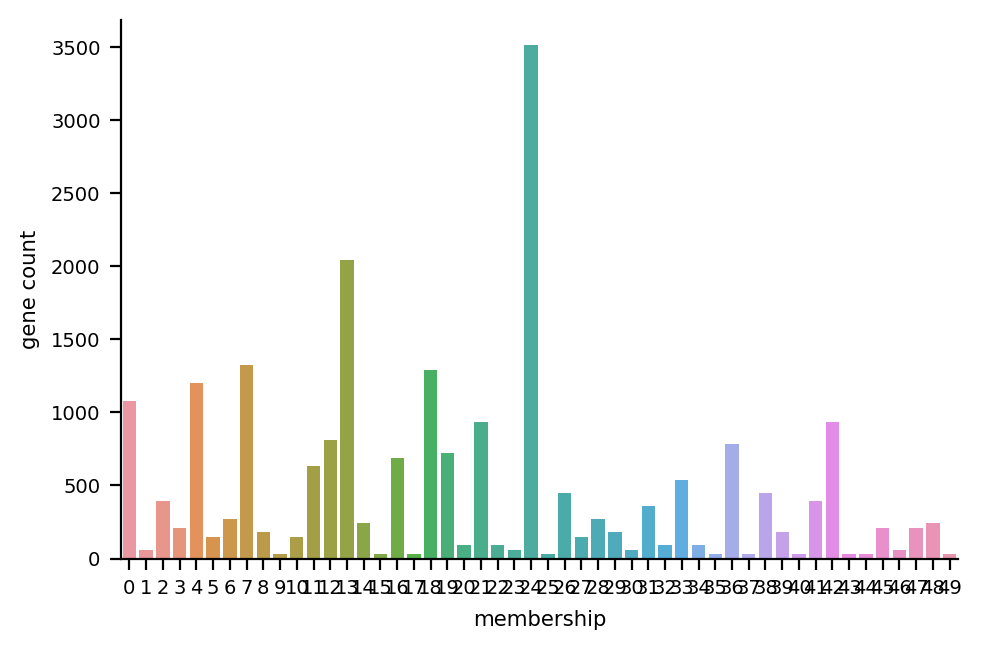

In [412]:
df = plot_df.membership.value_counts()
df.index.name = 'membership'
all_genes_bar_plot_df =  df.to_frame('counts').sort_values('membership').reset_index()

ax = sns.barplot(x="membership", y="counts", data=all_genes_bar_plot_df)
ax.set_ylabel('gene count')
sns.despine()

# Are X and Y genes expressed differently?

In [413]:
adata.var.chromosome.unique()

['1', '2', '3', '4', '5', ..., 'PAR', 'X', 'Y', 'Un', 'MT']
Length: 27
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [414]:
adata.var.chromosome[means_df.index]

gene
MIR1302-2HG      1
FAM138A          1
LOC100996442     1
LOC729737        1
LOC107985721     1
                ..
ND3             MT
ND4L            MT
ND4             MT
ND5             MT
CYTB            MT
Name: chromosome, Length: 26325, dtype: category
Categories (27, object): ['1', '2', '3', '4', ..., 'PAR', 'Un', 'X', 'Y']

In [415]:
plot_df = means_fine_df 
plot_df['chromosome'] = adata.var.chromosome[means_df.index]
plot_df = means_fine_df.groupby(['chromosome', 'membership']).membership.count().to_frame('counts').reset_index()
plot_df

,chromosome,membership,counts
0,1,0,0
1,1,1,0
2,1,2,0
3,1,3,0
4,1,4,0
...,...,...,...
1345,Y,45,0
1346,Y,46,0
1347,Y,47,0
1348,Y,48,0


In [416]:
# _df = plot_df.loc[plot_df.chromosome.isin(['X', 'Y', 'MT', '7'])]
# _df.loc['chromosome'] = _df.chromosome.cat.remove_unused_categories()
# g = sns.FacetGrid(_df, col="chromosome", hue="membership", height=2, aspect=4, col_wrap=2, sharey=False)
# g.map(sns.barplot, "membership", "counts", order=membership_labels) ;


In [ ]:
g = sns.FacetGrid(plot_df, col="chromosome", hue="membership", height=2, col_wrap=2, sharey=False)
g.map(sns.barplot, "membership", "counts", order=membership_labels) ;



# chromosomes = list(map(str, range(1,23))) + ['X']
# for chrom in chromosomes:
#     print(chrom)
#     chrom_genes = adata.var.loc[adata.var.chromosome == chrom, 'gene_ids']
#     chrom_genes = chrom_genes[~chr_genes.isnull()]

#     plot_df = means_df.loc[chr_genes].groupby('membership').membership.count().to_frame('counts').reset_index()
#     ax = sns.barplot(x="membership", y="counts", data=plot_df, order=membership_labels)
#     ax.set_ylabel('gene count')
#     sns.despine()
#     break
    
# for ax in g.axes.flat:
#     ax.tick_params(axis='x', labelrotation=90)
#     ax.set_xlabel(None)
#     ax.set_ylabel('norm_sct')
# g.set_titles(col_template="{col_name}", row_template="{row_name}") ;    

KeyboardInterrupt: 

# Interesting genes on MT

In [258]:
df = means_fine_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
l = df.loc[(df.chromosome == 'MT') & (df.membership.isin([3, 4, 5]))].index.values.tolist()
gi.gene_info(l)

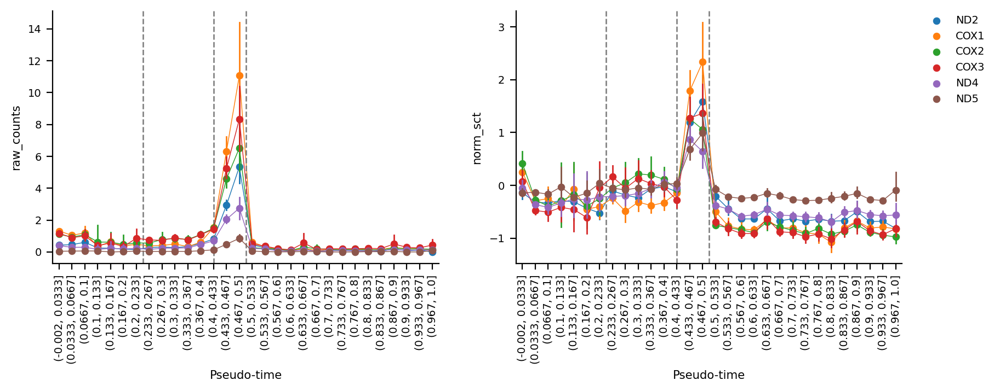

In [82]:
double_expr_plot(l) ;

In [95]:
all_cox = df.reset_index().loc[lambda df: df.gene.str.startswith('COX')]
all_cox

,gene,membership,chromosome
2470,COX20,1,1
2901,COX7A2L,0,2
3341,COX5B,0,2
5296,COX17,1,3
6290,COX7B2,4,4
6424,COX18,1,4
7668,COX7C,4,5
9268,COX7A2,5,6
9886,COX19,0,7
11901,COX6C,4,8


In [104]:
_df = gi.get_genes_region_dataframe('chr1', 49000000, 52000000, assembly='hg19')
_df

,name,start,end,strand
0,AGBL4,48998525,50489626,-
1,AGBL4,48998525,50489626,-
2,AGBL4,48998525,50489626,-
3,AGBL4,48998525,50489626,-
4,AGBL4,48998525,50489626,-
5,BEND5,49193190,49242563,-
6,BEND5,49193190,49242563,-
7,BEND5,49193190,49242563,-
8,BEND5,49193190,49242563,-
9,BEND5,49193190,49242563,-


missing: ['MIR4421', 'MIR6500', 'TTC39A-AS1']
missing: ['MIR4421', 'MIR6500', 'TTC39A-AS1']


(<AxesSubplot: xlabel='Pseudo-time', ylabel='raw_counts'>,
 <AxesSubplot: xlabel='Pseudo-time', ylabel='norm_sct'>)

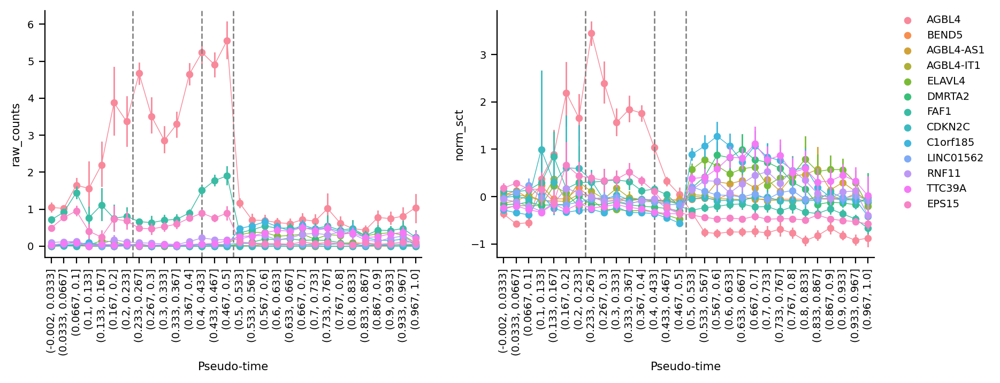

In [103]:
double_expr_plot(_df.name.unique().tolist())

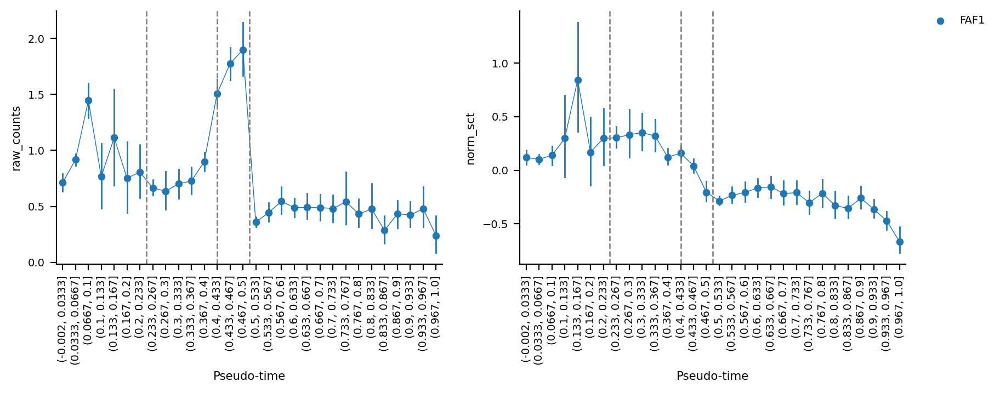

In [105]:
double_expr_plot('FAF1') ;

(<AxesSubplot: xlabel='Pseudo-time', ylabel='raw_counts'>,
 <AxesSubplot: xlabel='Pseudo-time', ylabel='norm_sct'>)

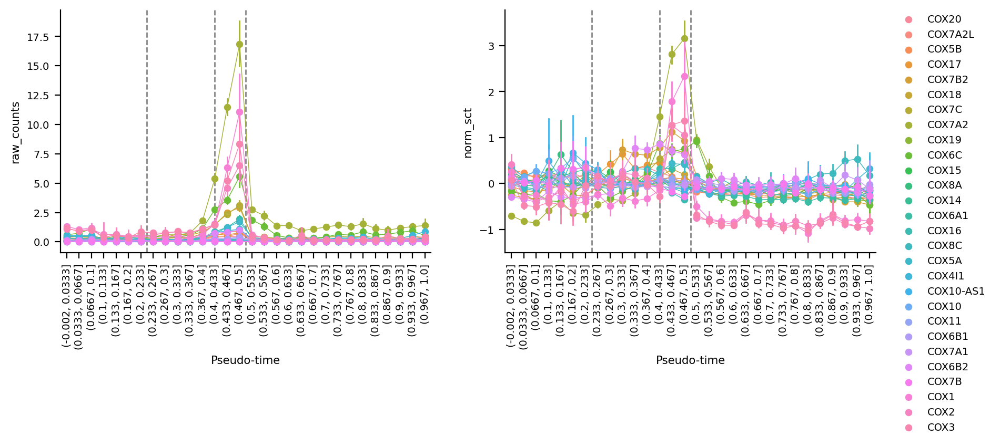

In [94]:
double_expr_plot(df.reset_index().loc[lambda df: df.gene.str.startswith('COX')].gene.tolist()) ;

# Interesting genes on X and Y

What are the pachytene genes on X?

In [ ]:
df = means_fine_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
l = df.loc[(df.chromosome == 'X') & (df.membership.isin([49]))].index.values.tolist()
gi.gene_info(l)

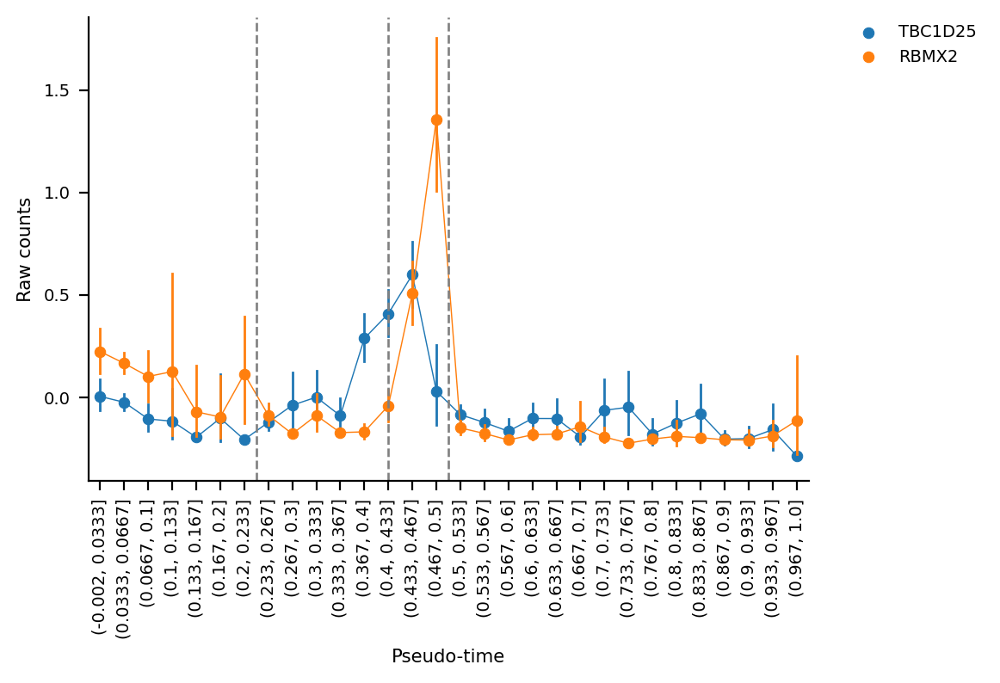

In [49]:
expr_plot(l, 'norm_sct') ;

**RBMX2**: Link to bipolar disorder: https://pubmed.ncbi.nlm.nih.gov/34914762/, and intelectual disability (gene card).

What are the strong spermatid genes on X (cluster 2):

In [50]:
l = df.loc[(df.chromosome == 'X') & (df.membership.isin([2]))].index.values.tolist()
l

['DYNLT3',
 'H2AP',
 'PPP1R2C',
 'PRICKLE3',
 'ZCCHC13',
 'UPF3B',
 'SPANXN3',
 'amplicon-chrX-SPANXA1/A2/N1/N2/N3/N4/N5/B1/C/D',
 'amplicon-chrX-CXorf51A/B',
 'amplicon-chrX-ETD1/B/ZNF75D',
 'amplicon-chrX-SPACA5/B']

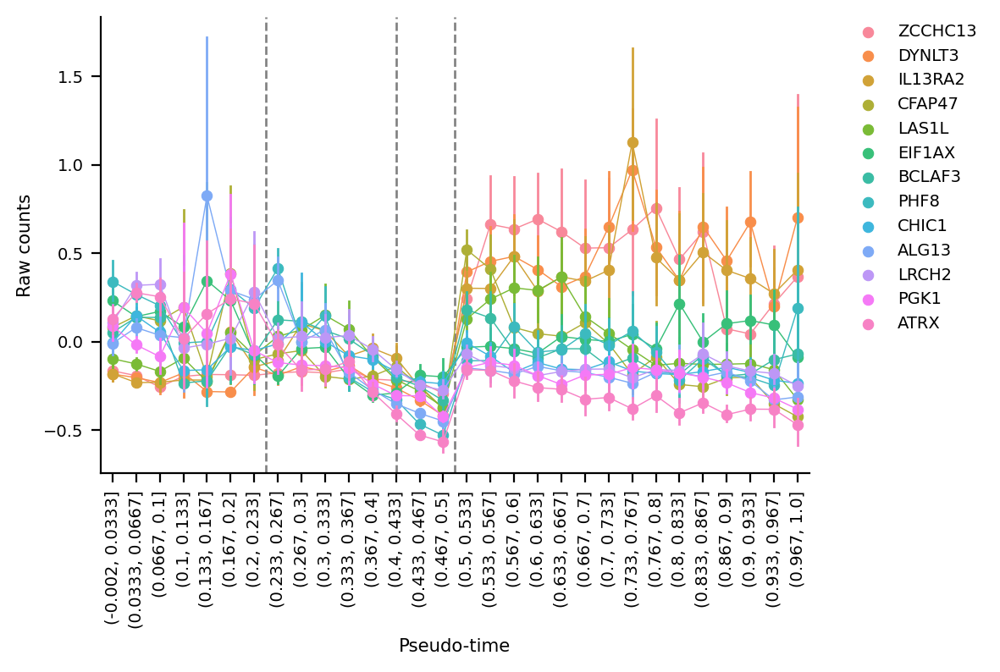

In [118]:
expr_plot(swept_meritxell_diffexp_genes.gene, 'norm_sct') ;

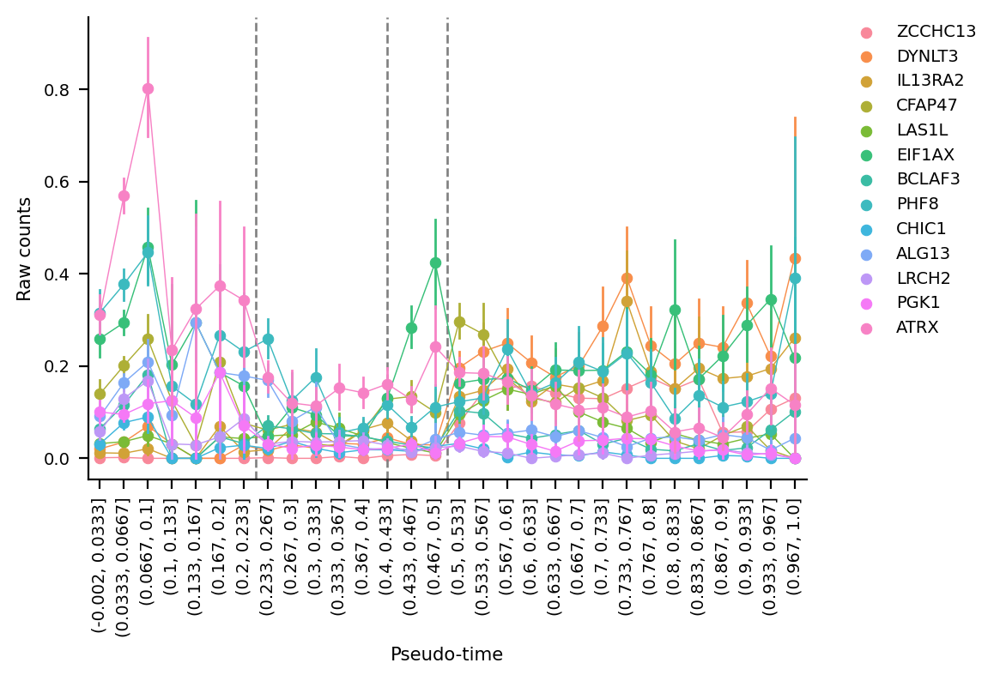

In [119]:
expr_plot(swept_meritxell_diffexp_genes.gene, 'raw_counts') ;

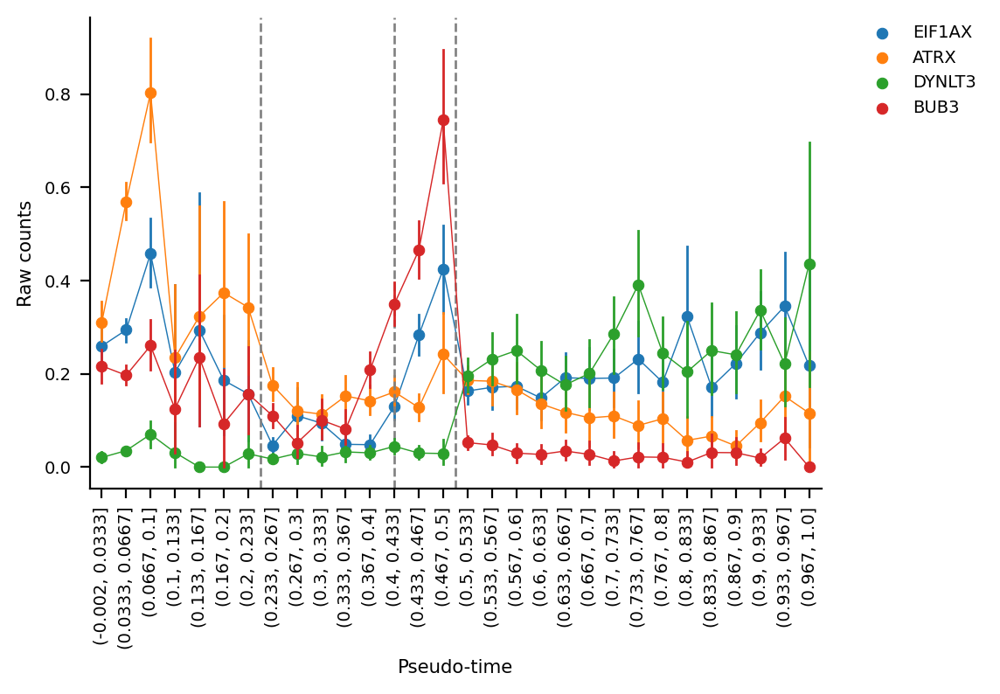

In [127]:
expr_plot(['EIF1AX', 'ATRX', 'DYNLT3', 'BUB3'], 'raw_counts') ;


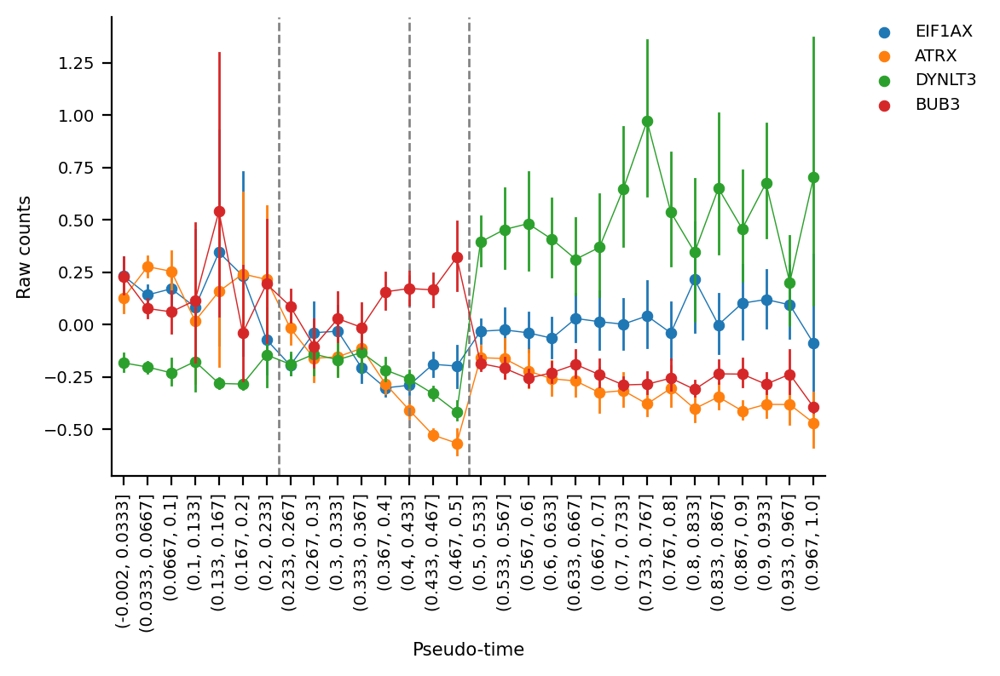

In [128]:
expr_plot(['EIF1AX', 'ATRX', 'DYNLT3', 'BUB3'], 'norm_sct') ;


What are the genes cluster 4 on Y:

In [52]:
df = means_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
df.loc[(df.chromosome == 'Y') & (df.membership.isin([2, 4]))].index.values.tolist()

['LINC00278',
 'TGIF2LY',
 'LOC105377227',
 'TTTY1B',
 'TTTY2B',
 'TTTY8B',
 'LOC107987339',
 'LOC105377229',
 'LOC105377231',
 'TTTY11',
 'TTTY8',
 'TTTY2',
 'TTTY1',
 'DDX3Y',
 'FAM41AY1',
 'FAM41AY2',
 'LOC102725532',
 'LOC101929148',
 'amplicon-chrY-BPY2/B/C',
 'amplicon-chrY-CDY1/1B/2A/2B',
 'amplicon-chrY-HSFY1/2',
 'amplicon-chrY-PRY/2']

What are the genes cluster 1 on MT:

In [53]:
df = means_df.loc[:, ['membership']] 
df['chromosome'] = adata.var.chromosome[df.index]
df.loc[(df.chromosome == 'MT') & (df.membership == 1)].index.values.tolist()

['ND1', 'ND2', 'COX2', 'COX3', 'ND4', 'ND5']

In [54]:
#[x for x in l if x in diff_exp_genes.gene]

# Grove 2019 genes

missing: ['NKX2-2']
missing: ['LOC102723661']
missing: ['POU3F2']
missing: ['NUD12']
missing: ['MROH5']
missing: ['APOPT1']


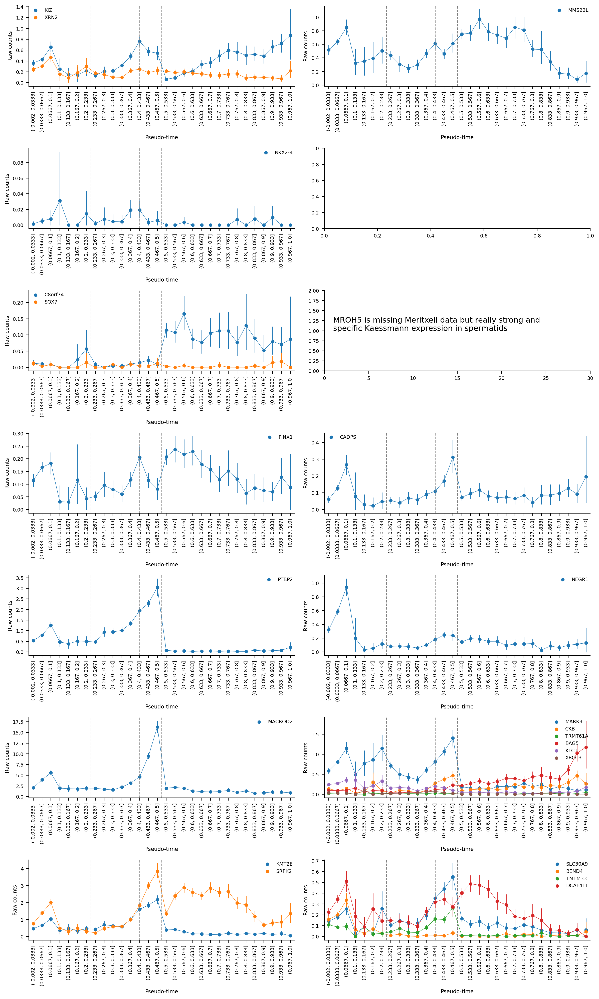

In [55]:
fig, axes = plt.subplots(7, 2, figsize=(12, 20))
expr_plot(['KIZ', 'XRN2'], 'raw_counts', ax=axes[0][0]); 
expr_plot(['NKX2-2', 'NKX2-4'], 'raw_counts', ax=axes[1][0]) 
expr_plot(['C8orf74', 'SOX7'], 'raw_counts', ax=axes[2][0])  
expr_plot(['PINX1'], 'raw_counts', ax=axes[3][0])  
expr_plot(['LOC102723661', 'PTBP2'], 'raw_counts', ax=axes[4][0]) 
expr_plot(['MACROD2'], 'raw_counts', ax=axes[5][0]) 
expr_plot(['KMT2E', 'SRPK2'], 'raw_counts', ax=axes[6][0]) 
expr_plot(['MMS22L', 'POU3F2'], 'raw_counts', ax=axes[0][1]) 
expr_plot(['NUD12'], 'raw_counts', ax=axes[1][1]) 
ax = expr_plot(['MROH5'], 'raw_counts', ax=axes[2][1])
ax.text(1, 1, "MROH5 is missing Meritxell data but really strong and\nspecific Kaessmann expression in spermatids", fontsize='x-large') ; ax.set_xlim(0, 30) ; ax.set_ylim(0, 2)
expr_plot(['CADPS'], 'raw_counts', ax=axes[3][1]) 
expr_plot(['NEGR1'], 'raw_counts', ax=axes[4][1])  
expr_plot(['MARK3', 'CKB', 'TRMT61A', 'BAG5', 'APOPT1', 'KLC1', 'XRCC3'], 'raw_counts', ax=axes[5][1])  
expr_plot(['SLC30A9', 'BEND4', 'TMEM33', 'DCAF4L1'], 'raw_counts', ax=axes[6][1])
plt.tight_layout()

### Genes with pachythene expression

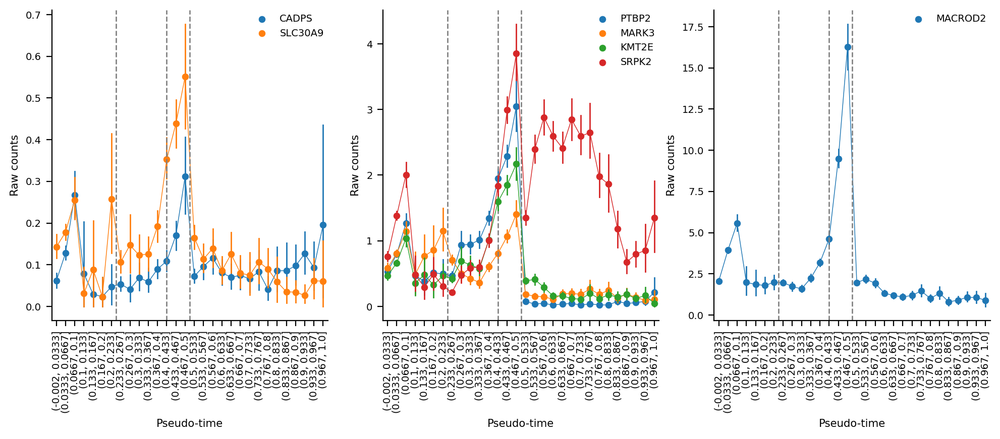

In [56]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax = expr_plot(['CADPS', 'SLC30A9'], 
               'raw_counts', ax=ax1)
ax = expr_plot(['PTBP2', 'MARK3', 'KMT2E', 'SRPK2'], 
               'raw_counts', ax=ax2)
ax = expr_plot(['MACROD2'], 
               'raw_counts', ax=ax3)

As an aside, OPHN1 (not a grove gene) which is also related to cerebral cortex neuron differentiation and intelectual disability, is also has a pachytene peak:

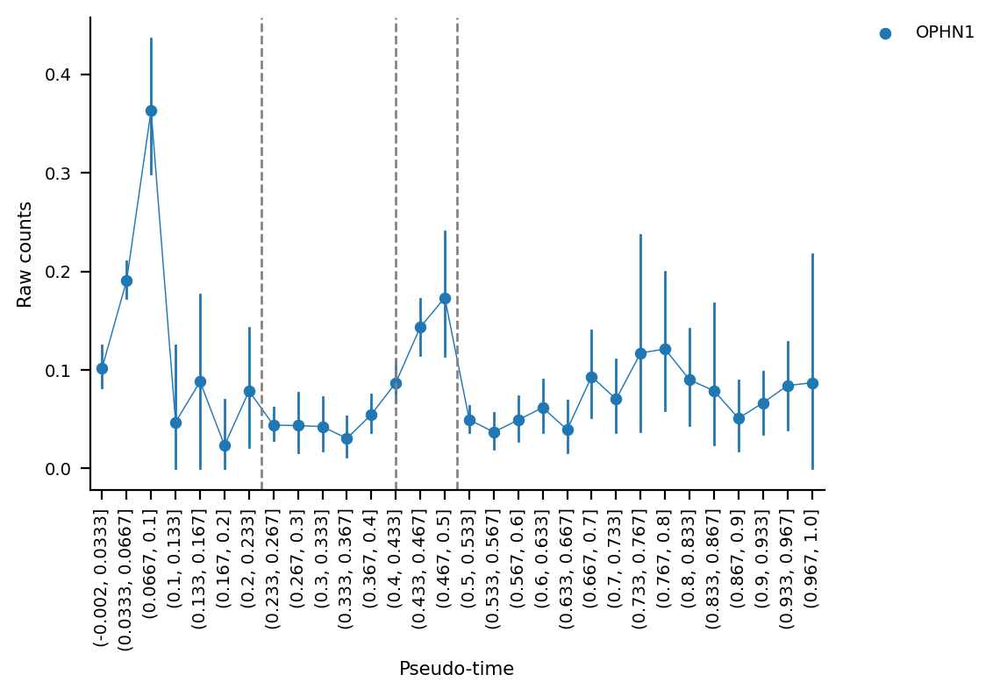

In [57]:
expr_plot('OPHN1', 'raw_counts') ;

Check if they are enriched for some GOs:

In [60]:
grove_pachytene_genes = ['CADPS', 'SLC30A9', 'PTBP2', 'MARK3', 'KMT2E', 'SRPK2', 'MACROD2']
go_results = gi.go_enrichment(grove_pachytene_genes, 
                              list_study_genes=True)
go_results

,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes


In [61]:
gi.gene_info(grove_pachytene_genes)

**Symbol:** **_CADPS_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CADPS1, CAPS, CAPS1, UNC-31  
*calcium dependent secretion activator*  
**Summary:** This gene encodes a novel neural/endocrine-specific cytosolic and peripheral membrane protein required for the Ca2+-regulated exocytosis of secretory vesicles. The protein acts at a stage in exocytosis that follows ATP-dependent priming, which involves the essential synthesis of phosphatidylinositol 4,5-bisphosphate (PtdIns(4,5)P2). Alternative splicing has been observed at this locus and three variants, encoding distinct isoforms, are described. [provided by RefSeq, Aug 2008].  
**Genomic position:** 3:62398346-62875416 (hg38), 3:62384022-62861054 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=CADPS)  


 ----

**Symbol:** **_SLC30A9_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BILAPES, C4orf1, GAC63, HUEL, ZNT9  
*solute carrier family 30 member 9*  
**Summary:** Predicted to enable nuclear receptor coactivator activity. Involved in cellular zinc ion homeostasis and zinc ion transport. Located in several cellular components, including cytoplasmic vesicle; cytoskeleton; and endoplasmic reticulum. [provided by Alliance of Genome Resources, Apr 2022]  
**Genomic position:** 4:41990502-42090461 (hg38), 4:41992489-42092474 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SLC30A9)  


 ----

**Symbol:** **_PTBP2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PTBLP, brPTB, nPTB  
*polypyrimidine tract binding protein 2*  
**Summary:** The protein encoded by this gene binds to intronic polypyrimidine clusters in pre-mRNA molecules and is implicated in controlling the assembly of other splicing-regulatory proteins. This protein is very similar to the polypyrimidine tract binding protein (PTB) but most of its isoforms are expressed primarily in the brain. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Jul 2014].  
**Genomic position:** 1:96721665-96823738 (hg38), 1:97187221-97289294 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PTBP2)  


 ----

**Symbol:** **_MARK3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CTAK1, KP78, PAR1A, Par-1a, VIPB  
*microtubule affinity regulating kinase 3*  
**Summary:** The protein encoded by this gene is activated by phosphorylation and in turn is involved in the phosphorylation of tau proteins MAP2 and MAP4. Several transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Oct 2011].  
**Genomic position:** 14:103385377-103503831 (hg38), 14:103851729-103970168 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MARK3)  


 ----

**Symbol:** **_KMT2E_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HDCMC04P, MLL5, NKp44L, ODLURO, SETD5B  
*lysine methyltransferase 2E (inactive)*  
**Summary:** This gene is a member of the myeloid/lymphoid or mixed-lineage leukemia (MLL) family and encodes a protein with an N-terminal PHD zinc finger and a central SET domain. Overexpression of the protein inhibits cell cycle progression. Alternate transcriptional splice variants have been characterized. [provided by RefSeq, Jul 2008].  
**Genomic position:** 7:104940943-105115019 (hg38), 7:104654626-104754808 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=KMT2E)  


 ----

**Symbol:** **_SRPK2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** SFRSK2  
*SRSF protein kinase 2*  
**Summary:** Enables ATP binding activity; magnesium ion binding activity; and protein serine/threonine kinase activity. Involved in several processes, including nucleic acid metabolic process; peptidyl-serine phosphorylation; and regulation of viral genome replication. Located in chromatin; cytosol; and nuclear lumen. [provided by Alliance of Genome Resources, Apr 2022]  
**Genomic position:** 7:105110704-105399308 (hg38), 7:104751151-105039755 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SRPK2)  


 ----

**Symbol:** **_MACROD2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** C20orf133, C2orf133  
*mono-ADP ribosylhydrolase 2*  
**Summary:** The protein encoded by this gene is a deacetylase involved in removing ADP-ribose from mono-ADP-ribosylated proteins. The encoded protein has been shown to translocate from the nucleus to the cytoplasm upon DNA damage. [provided by RefSeq, May 2017].  
**Genomic position:** 20:13995369-16053197 (hg38), 20:13976015-16033842 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MACROD2)  


 ----

GO enrichment using only terms associated with brain:

In [62]:
regex = 'brain'
term_subset = gi.get_terms_for_go_regex(regex)
print("nr terms:", len(term_subset))
go_genes = gi.get_genes_for_go_regex(regex)
print("nr genes:", len(go_genes))

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(comment def relationship synonym xref)
nr terms: 163
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(comment def relationship synonym xref)
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(comment def relationship synonym xref)
nr genes: 1168


In [63]:
go_results = gi.go_enrichment(grove_pachytene_genes, 
                              terms=term_subset,
                              list_study_genes=True)
go_results

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-09-19) 46,823 Terms; optional_attrs(def relationship)


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes


Overlap to genes with brain terms:

In [64]:
[x for x in grove_pachytene_genes if x in go_genes]

[]

Graph for GO terms associated with grove pachytene genes:

In [65]:
go_terms_for_grove_pachytene = gi.get_go_terms_for_genes(grove_pachytene_genes)
print(len(go_terms_for_grove_pachytene))
gi.show_go_dag_for_terms(go_terms_for_grove_pachytene)

104


### Genes with spermatid expression

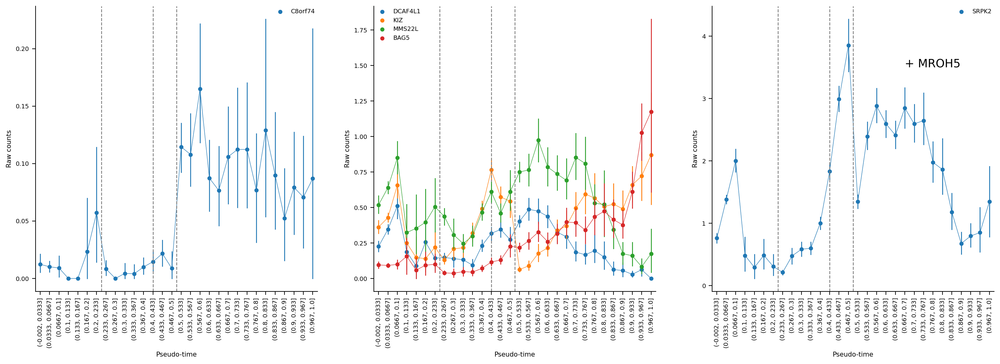

In [66]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
ax = expr_plot(['C8orf74'], 
               'raw_counts', ax=ax1)
ax = expr_plot(['DCAF4L1', 'KIZ', 'MMS22L', 'BAG5'], 
               'raw_counts', ax=ax2)
ax = expr_plot(['SRPK2'], 
               'raw_counts', ax=ax3)
ax.text(20, 3.5, "+ MROH5", fontsize='xx-large') ;

## 

In [67]:
# df = adata.to_df(layer='raw_counts')
# df['clst'] = adata.obs.clst_groups
# df.set_index('clst', inplace=True)
# df.columns.name = 'gene'
# df.loc[:, genes].stack().to_frame('exp').reset_index()

In [68]:
genes = ['CFAP47', 'AKAP4', 'DYNLT3', 'MAPT']

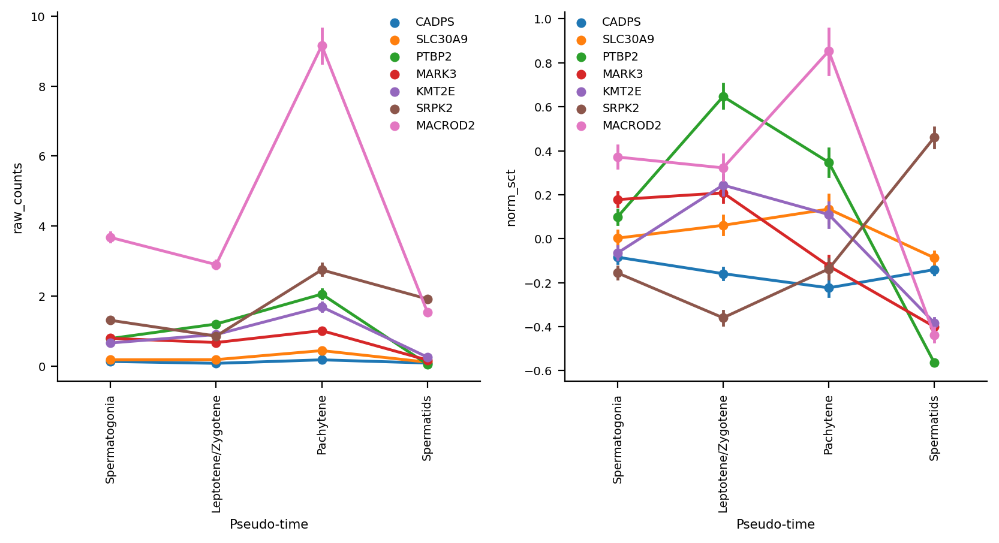

In [69]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
cat_plot(grove_pachytene_genes, 'raw_counts', ax=ax1)
cat_plot(grove_pachytene_genes, 'norm_sct', ax=ax2) ;

In [70]:
# sfari_genes = pd.read_csv('SFARI-Gene_genes_05-05-2022release_06-27-2022export.csv')
# sfari_genes.loc[sfari_genes.chromosome == 'X', 'gene-symbol'].to_list()

# Diff exp genes

In [71]:
diff_exp_genes = pd.read_csv('DEG_XY_spermatids_filtered_pval1_fc2.tsv', 
                             sep='\t', names=['gene', 'pval', 'logfold', '??'])
diff_exp_genes.head()

,gene,pval,logfold,??
0,UPF3B,2.427199e-210,3.967164,6.593486e-206
1,PPP1R2C,2.855867e-192,6.440151,3.878981e-188
2,amplicon-chrY-HSFY1/2,4.005483e-136,-5.372412,3.626965e-132
3,LINC00278,6.555618e-131,-7.146839,4.452084e-127
4,FAM230C,3.452027e-122,-6.145343,1.875486e-118


In [72]:
gene_has_data = means_df.index.isin(diff_exp_genes.gene)

prediction = kmeans.predict(means_df.loc[gene_has_data, clusters].values)

df = means_df.reset_index()
prediction_df = pd.DataFrame(dict(gene=df.loc[gene_has_data, 'gene'], membership=prediction))
prediction_df.head()

diff_exp_genes_with_pred = diff_exp_genes.merge(prediction_df, on='gene')

In [73]:
plot_df = means_df.loc[gene_has_data].melt(id_vars=['membership']).groupby('membership').variable.count().reset_index()
plot_df['membership'] = plot_df.membership.astype("category")
plot_df['membership'] = plot_df['membership'].cat.set_categories(membership_labels)

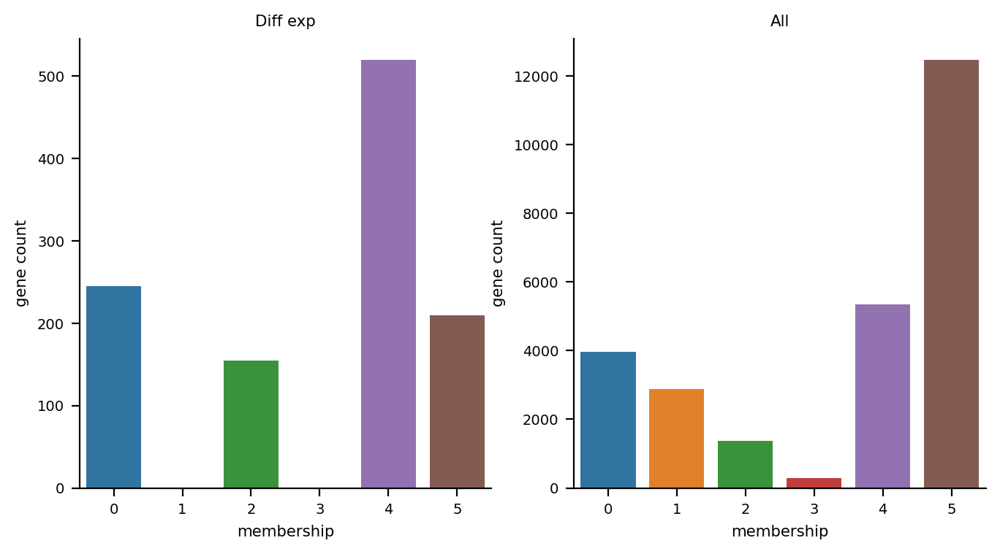

In [74]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax = sns.barplot(x="membership", y="variable", data=plot_df, order=membership_labels, ax=ax1)
ax.set_ylabel('gene count')
ax.set_title('Diff exp')
sns.despine()

ax = sns.barplot(x="membership", y="counts", data=all_genes_bar_plot_df, ax=ax2)
ax.set_ylabel('gene count')
ax.set_title('All')
sns.despine()

In [75]:
hexcolors = sns.color_palette().as_hex()
def _color_red_or_green(val):
    color = hexcolors[val]
    return 'background: %s' % color

diff_exp_genes_with_pred.style.applymap(_color_red_or_green, subset=['membership'])

,gene,pval,logfold,??,membership
0,UPF3B,0.000000,3.967164,0.000000,2
1,PPP1R2C,0.000000,6.440151,0.000000,2
2,amplicon-chrY-HSFY1/2,0.000000,-5.372412,0.000000,2
3,LINC00278,0.000000,-7.146839,0.000000,4
4,FAM230C,0.000000,-6.145343,0.000000,2
5,amplicon-chrX-SPANXA1/A2/N1/N2/N3/N4/N5/B1/C/D,0.000000,3.108779,0.000000,2
6,SYTL5,0.000000,3.720013,0.000000,4
7,PRICKLE3,0.000000,2.495548,0.000000,2
8,DIAPH2,0.000000,2.092402,0.000000,0
9,H2AP,0.000000,3.763709,0.000000,2


## CodeML signif genes

In [139]:
codeml_tessa.pval.max()

85.38678

In [138]:
codeml_tessa.loc[codeml_tessa.name == 'DYNLT3']

,name,alt_model,LR,pval
220,DYNLT3,2,2.898004e-10,9.05276
221,DYNLT3,8,4.865752e-11,8.50747
726,DYNLT3,2,2.898004e-10,9.05276
727,DYNLT3,8,4.865752e-11,8.50747


In [131]:
codeml_tessa.loc[codeml_tessa.name == 'BUB3']

,name,alt_model,LR,pval


In [77]:
genes_with_expr_data = codeml_tessa.loc[codeml_tessa.name.isin(means_df.index)].name

In [78]:
plot_df = means_df.loc[genes_with_expr_data].groupby('membership').membership.count().to_frame('counts').reset_index()

In [79]:
# plot_df = means_df.loc[genes_with_expr_data].melt(id_vars=['membership'])
# plot_df.head()

In [80]:
# plot_df['membership'] = plot_df.membership.astype("category")
# plot_df['membership'].cat.set_categories(membership_labels)
# cluster_members = plot_df.groupby('membership').variable.count().reset_index()

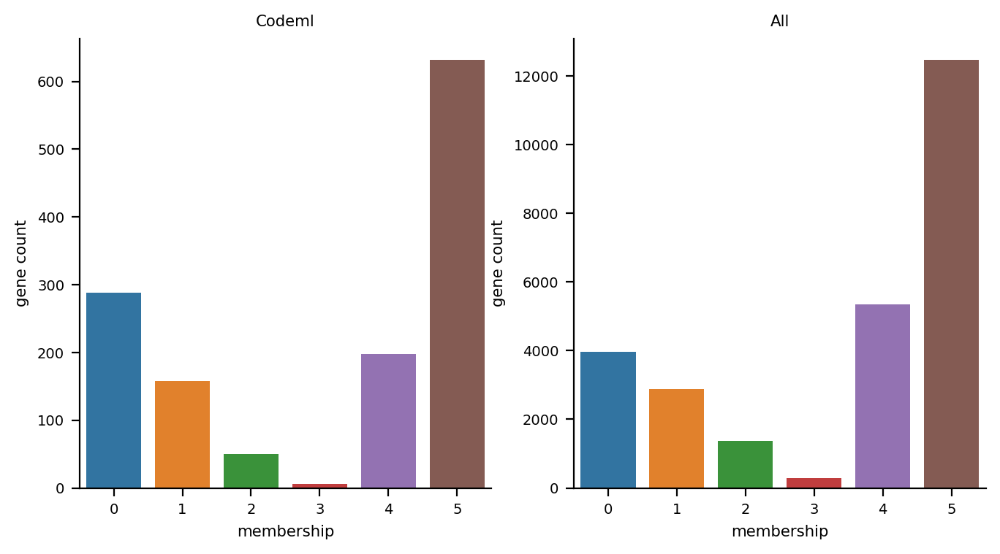

In [81]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

ax = sns.barplot(x="membership", y="counts", data=plot_df, order=membership_labels, ax=ax1)
ax.set_ylabel('gene count')
ax.set_title('Codeml')
sns.despine()

ax = sns.barplot(x="membership", y="counts", data=all_genes_bar_plot_df, ax=ax2)
ax.set_ylabel('gene count')
ax.set_title('All')
sns.despine()

#  Hand-picked contenders in swept regions on X

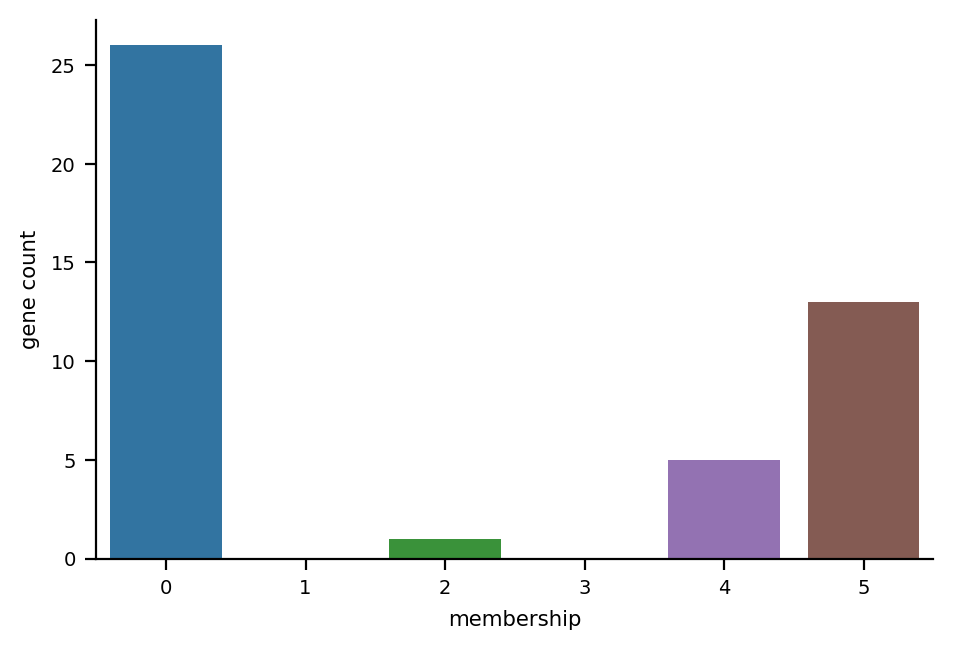

In [82]:
candidate_genes = pd.read_hdf('candidate_genes.hdf')
genes = candidate_genes.loc[candidate_genes.name.isin(means_df.index)].name

plot_df = means_df.loc[genes].groupby('membership').membership.count().to_frame('counts').reset_index()

ax = sns.barplot(x="membership", y="counts", data=plot_df, order=membership_labels)
ax.set_ylabel('gene count')
sns.despine()

# Genes on X that turn on in spermatids

In [98]:
df = (means_df
      .loc[x_genes]
      .loc[lambda df: df.membership.isin([2, 4])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)

def _color_membership(val):
    return f'background: {hexcolors[val]}'

def _color_candidates(val):
    # print(val, val in candidate_genes.name)
    if val in candidate_genes.name.to_list():
        color = "#FFC0CB50"
    else:
        color = 'none'
    return f'background: {color}'

with pd.option_context("display.max_rows", 1000):
    display(df.style.applymap(_color_membership, subset=['membership']).applymap(_color_candidates, subset=['gene']))

NameError: name 'x_genes' is not defined

In [ ]:
df = (means_df
      .loc[~means_df.index.isin(x_genes)]
      .loc[lambda df: df.membership.isin([2, 4])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)

# Genes on X with pachytene peak

In [ ]:
df = (means_df
      .loc[x_genes]
      .loc[lambda df: df.membership.isin([1, 3])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)
def _color_membership(val):
    return f'background: {hexcolors[val]}'

def _color_candidates(val):
    # print(val, val in candidate_genes.name)
    if val in candidate_genes.name.to_list():
        color = "#FFC0CB50"
    else:
        color = 'none'
    return f'background: {color}'

with pd.option_context("display.max_rows", 1000):
    display(df.style.applymap(_color_membership, subset=['membership']).applymap(_color_candidates, subset=['gene']))

In [ ]:
expr_plot(df.gene, 'raw_counts') ;

In [ ]:
gi.gene_info(df.gene)

# Non-X genes on X with pachytene peak

In [407]:
df = (means_df
      .loc[~means_df.index.isin(x_genes)]
      .loc[lambda df: df.membership.isin([1, 3])]
      .reset_index()
      .sort_values(by='gene')
     )
print(df.index.size)

6624


In [ ]:
2 / 3156 * 100, 150/3000 * 100

# See if non-X genes are enriched for brain stuff...

In [409]:
df.gene

4168                          A2ML1
26                          AADACL3
4011                          AAMDC
4065                       AASDHPPT
5184                           ABAT
                   ...             
6591        amplicon-chrX-TCP11X1/2
6619         amplicon-chrY-BPY2/B/C
6620    amplicon-chrY-CDY1/1B/2A/2B
6621          amplicon-chrY-HSFY1/2
6622            amplicon-chrY-PRY/2
Name: gene, Length: 6624, dtype: object

In [410]:
symbol2ncbi_file = f'geneinfo_cache/{9606}_symbol2ncbi.h5'
symbol2ncbi = pd.read_hdf(symbol2ncbi_file, 'ncbi2symbol')
protein_coding = symbol2ncbi.tolist()

In [97]:
import importlib
import geneinfo
importlib.reload(geneinfo)

print(df.gene.index.size)
go_results = gi.go_enrichment(df.gene.loc[df.gene.isin(protein_coding)], list_study_genes=True)
go_results

26325


NameError: name 'protein_coding' is not defined

In [412]:
go_results.term_id == 'GO:0007339'

0     False
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10    False
11    False
12    False
13    False
14    False
15    False
16    False
17    False
18    False
19    False
Name: term_id, dtype: bool

In [417]:
gi.go_info(go_results.term_id)

**<span style="color:gray;">GO:0003723:</span>** **RNA binding**  
 Binding to an RNA molecule or a portion thereof.    

 ----

**<span style="color:gray;">GO:0000137:</span>** **Golgi cis cisterna**  
 The Golgi cisterna closest to the endoplasmic reticulum; the first processing compartment through which proteins pass after export from the ER.    

 ----

**<span style="color:gray;">GO:0007342:</span>** **fusion of sperm to egg plasma membrane involved in single fertilization**  
 The binding and fusion of a sperm, with the plasma membrane of the oocyte as part of the process of single fertilization. In sperm with flagella, binding occurs at the posterior (post-acrosomal) region of the sperm head.    

 ----

**<span style="color:gray;">GO:0004984:</span>** **olfactory receptor activity**  
 Combining with an odorant and transmitting the signal from one side of the membrane to the other to initiate a change in cell activity in response to detection of smell.    

 ----

**<span style="color:gray;">GO:0050911:</span>** **detection of chemical stimulus involved in sensory perception of smell**  
 The series of events involved in the perception of smell in which an olfactory chemical stimulus is received and converted into a molecular signal.    

 ----

**<span style="color:gray;">GO:0007283:</span>** **spermatogenesis**  
 The developmental process by which male germ line stem cells self renew or give rise to successive cell types resulting in the development of a spermatozoa.    

 ----

**<span style="color:gray;">GO:0003735:</span>** **structural constituent of ribosome**  
 The action of a molecule that contributes to the structural integrity of the ribosome.    

 ----

**<span style="color:gray;">GO:0006607:</span>** **NLS-bearing protein import into nucleus**  
 The directed movement of a protein bearing a nuclear localization signal (NLS) from the cytoplasm into the nucleus, across the nuclear envelope.    

 ----

**<span style="color:gray;">GO:0004930:</span>** **G protein-coupled receptor activity**  
 Combining with an extracellular signal and transmitting the signal across the membrane by activating an associated G-protein; promotes the exchange of GDP for GTP on the alpha subunit of a heterotrimeric G-protein complex.    

 ----

**<span style="color:gray;">GO:0036126:</span>** **sperm flagellum**  
 A microtubule-based flagellum (or cilium) that is part of a sperm, a mature male germ cell that develops from a spermatid.    

 ----

**<span style="color:gray;">GO:0001669:</span>** **acrosomal vesicle**  
 A structure in the head of a spermatozoon that contains acid hydrolases, and is concerned with the breakdown of the outer membrane of the ovum during fertilization. It lies just beneath the plasma membrane and is derived from the lysosome.    

 ----

**<span style="color:gray;">GO:0045095:</span>** **keratin filament**  
 A filament composed of acidic and basic keratins (types I and II), typically expressed in epithelial cells. The keratins are the most diverse classes of IF proteins, with a large number of keratin isoforms being expressed. Each type of epithelium always expresses a characteristic combination of type I and type II keratins.    

 ----

**<span style="color:gray;">GO:0006412:</span>** **translation**  
 The cellular metabolic process in which a protein is formed, using the sequence of a mature mRNA or circRNA molecule to specify the sequence of amino acids in a polypeptide chain. Translation is mediated by the ribosome, and begins with the formation of a ternary complex between aminoacylated initiator methionine tRNA, GTP, and initiation factor 2, which subsequently associates with the small subunit of the ribosome and an mRNA or circRNA. Translation ends with the release of a polypeptide chain from the ribosome.    

 ----

**<span style="color:gray;">GO:0030317:</span>** **flagellated sperm motility**  
 The directed, self-propelled movement of a cilium (aka flagellum) that contributes to the movement of a flagellated sperm.    

 ----

**<span style="color:gray;">GO:0005801:</span>** **cis-Golgi network**  
 The network of interconnected tubular and cisternal structures located at the convex side of the Golgi apparatus, which abuts the endoplasmic reticulum.    

 ----

**<span style="color:gray;">GO:0005654:</span>** **nucleoplasm**  
 That part of the nuclear content other than the chromosomes or the nucleolus.    

 ----

**<span style="color:gray;">GO:0000049:</span>** **tRNA binding**  
 Binding to a transfer RNA.    

 ----

**<span style="color:gray;">GO:0005743:</span>** **mitochondrial inner membrane**  
 The inner, i.e. lumen-facing, lipid bilayer of the mitochondrial envelope. It is highly folded to form cristae.    

 ----

**<span style="color:gray;">GO:0097224:</span>** **sperm connecting piece**  
 The segment of the sperm flagellum that attaches to the implantation fossa of the nucleus in the sperm head; from the remnant of the centriole at this point, the axoneme extends throughout the length of the flagellum.    

 ----

**<span style="color:gray;">GO:0005856:</span>** **cytoskeleton**  
 A cellular structure that forms the internal framework of eukaryotic and prokaryotic cells. The cytoskeleton includes intermediate filaments, microfilaments, microtubules, the microtrabecular lattice, and other structures characterized by a polymeric filamentous nature and long-range order within the cell. The various elements of the cytoskeleton not only serve in the maintenance of cellular shape but also have roles in other cellular functions, including cellular movement, cell division, endocytosis, and movement of organelles.    

 ----

In [414]:
go_results.loc[go_results.term_id == 'GO:0034587'].study_genes

Series([], Name: study_genes, dtype: object)

In [86]:
gi.gene_info(go_results.loc[go_results.term_id == 'GO:0034587'].study_genes)

HTTPError: 400 Client Error: search_phase_execution_exception for url: https://mygene.info/v3/query?q=Series(%5B%5D,%20Name:%20study_genes,%20dtype:%20object)&scopes=hgnc&species=human&fields=symbol,alias,name,type_of_gene,summary,genomic_pos,genomic_pos_hg19

In [85]:
ax = expr_plot(go_results.iloc[0].study_genes, 'raw_counts') ;
h,l = ax.axes.get_legend_handles_labels()
ax.legend_.remove()
ax.legend(h,l, ncol=4, bbox_to_anchor=(1.1, 1.05), frameon=False)
#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1), frameon=False)

IndexError: single positional indexer is out-of-bounds

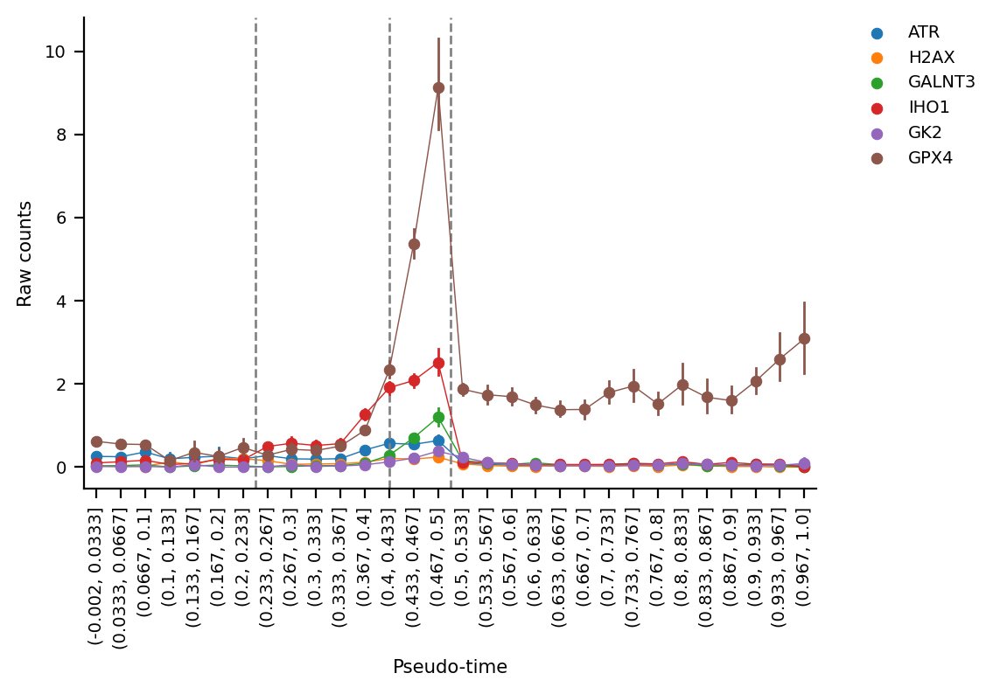

In [87]:
ax = expr_plot(['ATR', 'H2AX', 'GALNT3', 'IHO1', 'GK2', 'GPX4'], 'raw_counts') ;

In [88]:
gi.gene_info('GPX4')

**Symbol:** **_GPX4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** GPx-4, GSHPx-4, MCSP, PHGPx, SMDS, snGPx, snPHGPx  
*glutathione peroxidase 4*  
**Summary:** The protein encoded by this gene belongs to the glutathione peroxidase family, members of which catalyze the reduction of hydrogen peroxide, organic hydroperoxides and lipid hydroperoxides, and thereby protect cells against oxidative damage. Several isozymes of this gene family exist in vertebrates, which vary in cellular location and substrate specificity. This isozyme has a high preference for lipid hydroperoxides and protects cells against membrane lipid peroxidation and cell death. It is also required for normal sperm development; thus, it has been identified as a 'moonlighting' protein because of its ability to serve dual functions as a peroxidase, as well as a structural protein in mature spermatozoa. Mutations in this gene are associated with Sedaghatian type of spondylometaphyseal dysplasia (SMDS). This isozyme is also a selenoprotein, containing the rare amino acid selenocysteine (Sec) at its active site. Sec is encoded by the UGA codon, which normally signals translation termination. The 3' UTRs of selenoprotein mRNAs contain a conserved stem-loop structure, designated the Sec insertion sequence (SECIS) element, that is necessary for the recognition of UGA as a Sec codon, rather than as a stop signal. Transcript variants resulting from alternative splicing or use of alternate promoters have been described to encode isoforms with different subcellular localization. [provided by RefSeq, Dec 2018].  
**Genomic position:** 19:1103994-1106791 (hg38), 19:1103936-1106787 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=GPX4)  


 ----

In [89]:
means_df.loc[means_df.index.intersection(grove_2019)]

,Spermatogonia,Leptotene/Zygotene,Pachytene,Spermatids,membership,chromosome
gene,,,,,,
NEGR1,0.364887,-0.316432,-0.417365,-0.261411,0,1
PTBP2,0.098892,0.646635,0.347283,-0.564428,1,1
CADPS,-0.084280,-0.159095,-0.223662,-0.140778,5,3
TMEM33,0.084526,0.059220,0.115882,-0.182028,5,4
DCAF4L1,0.092088,-0.079432,-0.241461,0.171046,4,4
SLC30A9,0.002509,0.060817,0.134585,-0.087148,5,4
BEND4,0.505065,-0.177027,-0.275587,-0.198098,0,4
MMS22L,0.078082,0.013795,-0.425590,0.252423,4,6
KMT2E,-0.065056,0.243786,0.109878,-0.382531,5,7


In [90]:
all_genes = set()
for gene_set in go_results.study_genes:
    all_genes.update(gene_set)
print(len(all_genes))

0


In [91]:
'PTBP2' in all_genes

False

In [92]:
set(all_genes).intersection(set(grove_2019))

set()

In [93]:
set(all_genes).intersection(set(sfari_genes))

set()

In [94]:
set(all_genes).intersection(set(codeml_tessa))

set()

In [95]:
gi.show_go_dag_for_terms(go_results.term_id)

In [96]:
gi.go_info(go_results.term_id)

# Hmm... 

Only 0.06% of pathytene peak genes are on X although the X is 5% of genome.... And both associated with intelectual disability...

In [ ]:
gi.gene_info('DYNLT3')

In [ ]:
cat_plot(df.gene, 'raw_counts') ;

In [ ]:
#gi.geneinfo(df.gene.to_list())

# Genes in chr3 region

In [ ]:
# %env ftp_proxy http://proxyserv:3128
# %env http_proxy http://proxyserv:3128
# %env https_proxy http://proxyserv:3128

In [ ]:
chr3region_genes = adata.var.loc[adata.var.chromosome == '3', 'gene_ids']
chr3region_genes = chr3region_genes[~chr3region_genes.isnull()]

chr3region_genes = pd.Series([record[0] for record in gi.get_genes_region('chr3', 47000000, 53000000, assembly='hg38')])
chr3region_genes = chr3region_genes.loc[chr3region_genes.isin(means_df.index)]

In [ ]:
df = (means_df
      .loc[chr3region_genes.unique()]
      .loc[lambda df: df.membership.isin([1, 3])]
      .reset_index()
      .sort_values(by='gene')
     )
with pd.option_context("display.max_rows", 1000):
    display(df)

In [ ]:
cat_plot(df.gene, 'raw_counts') ;

In [ ]:
cat_plot(['NDUFAF3'], 'raw_counts') ;

In [ ]:
df = (means_df
      .loc[chr3region_genes]
      .loc[lambda df: df.membership.isin([9, 1])]
      .reset_index()
      .sort_values(by='gene')
     )
with pd.option_context("display.max_rows", 1000):
    display(df)

In [ ]:
cat_plot(df.gene, 'raw_counts')

In [ ]:
df = (means_df
      .loc[lambda df: df.membership.isin([1, 9])]
      .reset_index()
      .sort_values(by='gene')
     )

def _color_membership(val):
    return f'background: {hexcolors[val]}'

def _color_candidates(val):
    # print(val, val in candidate_genes.name)
    if val in candidate_genes.name.to_list():
        color = "#FFC0CB50"
    else:
        color = 'none'
    return f'background: {color}'


with pd.option_context("display.max_rows", 1000):
    display(df.style.applymap(_color_membership, subset=['membership']).applymap(_color_candidates, subset=['gene']))
   